In [2]:
import numpy as np
import os
import pandas as pd
from arcpy import env
from arcpy import TableToTable_conversion
import matplotlib.ticker as mtick

dirWork = os.getcwd()
dirData = os.path.join(dirWork, r'data')
dirCCS  = os.path.join(dirData, r'udot-ccs')
dirProcessed = os.path.join(dirWork, r'data-processed\ccs')
dirResults = os.path.join(dirWork, r'data-processed\factors')

print("Working Directory: " + dirWork)
print("Data Directory: " + dirData)
print("CCS Directory: " + dirCCS)

Working Directory: E:\GitHub\V-over-C-Calculations
Data Directory: E:\GitHub\V-over-C-Calculations\data
CCS Directory: E:\GitHub\V-over-C-Calculations\data\udot-ccs


# TOD will use Season Groups 

In [3]:
df_SeasonSiteGroups = pd.read_csv(os.path.join(dirCCS, r'SeasonSiteGroups.csv'))
df_SeasonSiteGroups

,SiteGroupSeason,SsnGrp,SsnATGroup,SsnVolCls
0,SN0,AlpineLoop,0-AllAreaTypes,0-AllVolumes
1,SN1,BearLake,0-AllAreaTypes,0-AllVolumes
2,SN2,BigCottonwood,0-AllAreaTypes,0-AllVolumes
3,SN3,CedarBreaks,0-AllAreaTypes,0-AllVolumes
4,SN4,FreewayI15,1-Rural,0-AllVolumes
5,SN5,FreewayI15,2-Transition,0-AllVolumes
6,SN6,FreewayI15,3-Suburban,0-AllVolumes
7,SN7,FreewayI15,4-Urban,0-AllVolumes
8,XX1,FreewayI15,5-CBD,0-AllVolumes
9,SN8,FreewayI215,0-AllAreaTypes,0-AllVolumes


In [4]:
df_Sites_bySiteGroup = pd.read_json(os.path.join(dirCCS,  r'sitegroups_ccs.json'))
df_Sites_bySiteGroup = df_Sites_bySiteGroup.rename(columns={"SiteGroup": "SiteGroupSeason"})
df_Sites_bySiteGroup

,SiteGroupSeason,SiteID,SiteName
0,SN0,601,601: SR 92 American Fork Canyon W Toll Booth M...
1,SN0,602,602: SR 92 American Fork Canyon E Toll Booth M...
2,SN1,304,"304: SR 89 0.6 mile N of SR 30, Garden City MP..."
3,SN1,362,"362: SR 89 0.2 mile W of SR 30, Garden City MP..."
4,SN2,322,322: SR 190 Mouth of Big Cottonwood Cyn. MP 2....
...,...,...,...
336,WDH,614,614: I 84 3.2 miles W of Bothwell Int. MP 36.6...
337,WDI,624,624: SR 67 Legacy Parkway MP 0.944 FC 12
338,WDI,625,625: SR 67 Legacy Parkway MP 11.418 FC 12
339,WDJ,619,"619: SR 201 6174 W, SLC MP 10.600 FC 12"


In [5]:
#only show season site groups
df_Sites_bySeasonSiteGroup = df_Sites_bySiteGroup[df_Sites_bySiteGroup['SiteGroupSeason'].str.contains("SN")] 

pd.set_option('display.max_rows', df_Sites_bySeasonSiteGroup.shape[0]+1)

df_Sites_bySeasonSiteGroup

,SiteGroupSeason,SiteID,SiteName
0,SN0,601,601: SR 92 American Fork Canyon W Toll Booth M...
1,SN0,602,602: SR 92 American Fork Canyon E Toll Booth M...
2,SN1,304,"304: SR 89 0.6 mile N of SR 30, Garden City MP..."
3,SN1,362,"362: SR 89 0.2 mile W of SR 30, Garden City MP..."
4,SN2,322,322: SR 190 Mouth of Big Cottonwood Cyn. MP 2....
5,SN3,382,"382: SR 14 1.7 miles E of SR 130, Cedar City M..."
6,SN4,310,310: I 15 3 miles S of Plymouth Int. MP 389.34...
7,SN4,313,313: I 15 1 mile S of Scipio Int. MP 187.083 F...
8,SN4,349,349: I 15 2 miles N of Santaquin Int. MP 246.9...
9,SN4,502,502: I 15 0.5 mile S of Nephi Int. MP 222.158 ...


# Continuous Count Station (CCS) Data

## Import and Process CCS Hourly Data

In [6]:
#set to true for first time to create CSVs, false to speed up for subsequent times
process_HrVoldbftocsv = False

In [7]:
#set filenames for CCS data
dbf_HrVol_Lane = os.path.join(dirCCS,  r'tblHourlyVolumes.dbf')
csv_HrVol_Lane = os.path.join(dirProcessed, r'CCS_HourlyVolumes.csv')

In [8]:
# Create function that converts dbfs to csvs using arcpy
def dbfToCSV(dbf, csv):
    TableToTable_conversion(dbf, os.path.dirname(csv), os.path.basename(csv))

# Allow arcpy to overwrite output files
env.overwriteOutput = True

# convert dbfs to csvs
if process_HrVoldbftocsv:
    print("CCS DBF converting to CSV.")
    dbfToCSV(dbf_HrVol_Lane, csv_HrVol_Lane)
    print("CCS done.")
else:
    print("Don't convert CCS DBF.")

print('Done')
        

Don't convert CCS DBF.
Done


In [9]:
df_HrVol_Lane = pd.read_csv(csv_HrVol_Lane)

#Remove where exclude is 0
df_HrVol_Lane = df_HrVol_Lane[df_HrVol_Lane.Exclude == 0]

#Remove where holiday is 0
df_HrVol_Lane = df_HrVol_Lane[df_HrVol_Lane.Holiday == 0]

#Remove where holiday not 2018
df_HrVol_Lane = df_HrVol_Lane[df_HrVol_Lane.intYear != 2018]

df_HrVol_Lane

,OID_,SiteID,Direction,intYear,bytMonth,bytDay,bytLane,bytHour,Volume,DOW,Holiday,Exclude
24,NaN,301,N,2013,1,2,0,0,133,4,0,0
25,NaN,301,N,2013,1,2,0,1,112,4,0,0
26,NaN,301,N,2013,1,2,0,2,59,4,0,0
27,NaN,301,N,2013,1,2,0,3,66,4,0,0
28,NaN,301,N,2013,1,2,0,4,132,4,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9080369,NaN,714,P,2017,12,31,0,19,34,1,0,0
9080370,NaN,714,P,2017,12,31,0,20,23,1,0,0
9080371,NaN,714,P,2017,12,31,0,21,32,1,0,0
9080372,NaN,714,P,2017,12,31,0,22,30,1,0,0


In [10]:
df_HrVol = df_HrVol_Lane.groupby(['SiteID','Direction','intYear','bytMonth','bytDay','bytHour','Volume','DOW']).agg({'bytLane': [np.size]})

df_HrVol.reset_index(level=df_HrVol.index.names, inplace=True)

df_HrVol.columns = df_HrVol.columns.droplevel(1)

df_HrVol = df_HrVol.rename(columns={('bytLane'):'numLanes'})

df_HrVol

,SiteID,Direction,intYear,bytMonth,bytDay,bytHour,Volume,DOW,numLanes
0,301,N,2013,1,2,0,133,4,1
1,301,N,2013,1,2,1,112,4,1
2,301,N,2013,1,2,2,59,4,1
3,301,N,2013,1,2,3,66,4,1
4,301,N,2013,1,2,4,132,4,1
...,...,...,...,...,...,...,...,...,...
8719789,714,P,2017,12,31,19,34,1,1
8719790,714,P,2017,12,31,20,23,1,1
8719791,714,P,2017,12,31,21,32,1,1
8719792,714,P,2017,12,31,22,30,1,1


In [11]:
df_DyVol = df_HrVol.groupby(['SiteID','Direction','intYear','bytMonth','bytDay','DOW']).agg({'Volume': [np.sum, np.size]})
df_DyVol

Volume     
                                                sum size
SiteID Direction intYear bytMonth bytDay DOW            
301    N         2013    1        2      4    23874   24
                                  3      5    23721   24
                                  4      6    25482   24
                                  5      7    23810   24
                                  6      1    18814   24
...                                             ...  ...
714    P         2017    12       27     4     1303   24
                                  28     5     1330   24
                                  29     6     1342   24
                                  30     7     1158   24
                                  31     1      851   24

[363327 rows x 2 columns]

In [12]:
df_DyVol.groupby(['SiteID','Direction','intYear']).agg({('Volume','sum'): [np.mean, np.size]})

Volume     
                                   sum     
                                  mean size
SiteID Direction intYear                   
301    N         2013     23860.736686  338
                 2014     25303.962099  343
                 2015     27054.488439  346
                 2016     28179.628571  350
                 2017     28415.233236  343
...                                ...  ...
714    N         2016       870.185185  351
                 2017      1160.034582  347
       P         2015       638.965714  350
                 2016       876.504274  351
                 2017      1153.985591  347

[1076 rows x 2 columns]

In [13]:
df_DyVol.groupby(['intYear']).agg({('Volume','sum'): [np.mean]})

,Volume
,sum
,mean
intYear,
2013,13340.652635
2014,15119.088750
2015,15372.928158
2016,16402.884376
2017,17432.316665


In [14]:
dHrPrd = {
     'Hr'   : [   0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,   0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23],
     'Prd'  : ['EV','EV','EV','EV','EV','EV','AM','AM','AM','MD','MD','MD','MD','MD','MD','PM','PM','PM','EV','EV','EV','EV','EV','EV','DY','DY','DY','DY','DY','DY','DY','DY','DY','DY','DY','DY','DY','DY','DY','DY','DY','DY','DY','DY','DY','DY','DY','DY']
}

df_HrPrd = pd.DataFrame(dHrPrd)
df_HrPrd

,Hr,Prd
0,0,EV
1,1,EV
2,2,EV
3,3,EV
4,4,EV
5,5,EV
6,6,AM
7,7,AM
8,8,AM
9,9,MD


In [15]:
df_HrVol_wPrd = pd.DataFrame.merge(df_HrVol, df_HrPrd, left_on='bytHour', right_on='Hr', how='inner')
df_HrVol_wPrd

,SiteID,Direction,intYear,bytMonth,bytDay,bytHour,Volume,DOW,numLanes,Hr,Prd
0,301,N,2013,1,2,0,133,4,1,0,EV
1,301,N,2013,1,2,0,133,4,1,0,DY
2,301,N,2013,1,3,0,189,5,1,0,EV
3,301,N,2013,1,3,0,189,5,1,0,DY
4,301,N,2013,1,4,0,204,6,1,0,EV
...,...,...,...,...,...,...,...,...,...,...,...
17439583,714,P,2017,12,29,23,15,6,1,23,DY
17439584,714,P,2017,12,30,23,11,7,1,23,EV
17439585,714,P,2017,12,30,23,11,7,1,23,DY
17439586,714,P,2017,12,31,23,14,1,1,23,EV


In [16]:
#combine directions
df_HrVol_wPrd_DirGrouped = df_HrVol_wPrd.groupby(['SiteID','intYear','bytMonth','bytDay','DOW','Prd','bytHour'], as_index=False).agg({'Volume':[np.sum]})
df_HrVol_wPrd_DirGrouped.columns = (['SiteID','intYear','bytMonth','bytDay','DOW','Prd','bytHour','VolHr'])
df_HrVol_wPrd_DirGrouped

,SiteID,intYear,bytMonth,bytDay,DOW,Prd,bytHour,VolHr
0,301,2013,1,2,4,AM,6,1862
1,301,2013,1,2,4,AM,7,3305
2,301,2013,1,2,4,AM,8,3795
3,301,2013,1,2,4,DY,0,263
4,301,2013,1,2,4,DY,1,195
...,...,...,...,...,...,...,...,...
8720115,714,2017,12,31,1,MD,13,159
8720116,714,2017,12,31,1,MD,14,150
8720117,714,2017,12,31,1,PM,15,139
8720118,714,2017,12,31,1,PM,16,113


In [17]:
df_PrdVol = df_HrVol_wPrd_DirGrouped.groupby(['SiteID','intYear','bytMonth','bytDay','DOW','Prd'], as_index=False).agg({'bytHour':[np.size],'VolHr':[np.sum, np.max]})
df_PrdVol.columns = ('SiteID','intYear','bytMonth','bytDay','DOW','Prd','numHrsPrd','VolPrd','VolPkHr')
df_PrdVol['VolPkHrPctPrd'] = df_PrdVol['VolPkHr'] / df_PrdVol['VolPrd']
df_PrdVol

,SiteID,intYear,bytMonth,bytDay,DOW,Prd,numHrsPrd,VolPrd,VolPkHr,VolPkHrPctPrd
0,301,2013,1,2,4,AM,3,8962,3795,0.423455
1,301,2013,1,2,4,DY,24,48604,4511,0.092811
2,301,2013,1,2,4,EV,12,10791,3167,0.293485
3,301,2013,1,2,4,MD,6,17049,3045,0.178603
4,301,2013,1,2,4,PM,3,11802,4511,0.382223
...,...,...,...,...,...,...,...,...,...,...
908342,714,2017,12,31,1,AM,3,139,68,0.489209
908343,714,2017,12,31,1,DY,24,1744,180,0.103211
908344,714,2017,12,31,1,EV,12,459,79,0.172113
908345,714,2017,12,31,1,MD,6,792,180,0.227273


In [18]:
df_DyVol = df_PrdVol[df_PrdVol['Prd']=='DY']
df_DyVol = df_DyVol.groupby(['SiteID','intYear','bytMonth','bytDay','DOW'], as_index=False).agg({'numHrsPrd':[np.sum],'VolPrd':[np.sum]})
df_DyVol.columns = ('SiteID','intYear','bytMonth','bytDay','DOW','numHrsDY','VolDY')
df_DyVol

,SiteID,intYear,bytMonth,bytDay,DOW,numHrsDY,VolDY
0,301,2013,1,2,4,24,48604
1,301,2013,1,3,5,24,48287
2,301,2013,1,4,6,24,51901
3,301,2013,1,5,7,24,47536
4,301,2013,1,6,1,24,36662
...,...,...,...,...,...,...,...
181665,714,2017,12,27,4,24,2712
181666,714,2017,12,28,5,24,2661
181667,714,2017,12,29,6,24,2735
181668,714,2017,12,30,7,24,2276


In [19]:
df_PrdVol_wDY = pd.DataFrame.merge(df_PrdVol,df_DyVol,on=(['SiteID','intYear','bytMonth','bytDay','DOW']),how='inner')
df_PrdVol_wDY['VolPkHrPctDY'] = df_PrdVol_wDY['VolPkHr'] / df_PrdVol_wDY['VolDY']
df_PrdVol_wDY

,SiteID,intYear,bytMonth,bytDay,DOW,Prd,numHrsPrd,VolPrd,VolPkHr,VolPkHrPctPrd,numHrsDY,VolDY,VolPkHrPctDY
0,301,2013,1,2,4,AM,3,8962,3795,0.423455,24,48604,0.078080
1,301,2013,1,2,4,DY,24,48604,4511,0.092811,24,48604,0.092811
2,301,2013,1,2,4,EV,12,10791,3167,0.293485,24,48604,0.065159
3,301,2013,1,2,4,MD,6,17049,3045,0.178603,24,48604,0.062649
4,301,2013,1,2,4,PM,3,11802,4511,0.382223,24,48604,0.092811
...,...,...,...,...,...,...,...,...,...,...,...,...,...
908342,714,2017,12,31,1,AM,3,139,68,0.489209,24,1744,0.038991
908343,714,2017,12,31,1,DY,24,1744,180,0.103211,24,1744,0.103211
908344,714,2017,12,31,1,EV,12,459,79,0.172113,24,1744,0.045298
908345,714,2017,12,31,1,MD,6,792,180,0.227273,24,1744,0.103211


## Charts by Site - Variation of %Prd over Year

In [20]:
def fnPlotSiteYear(plotSite, plotYear):
    
    df_plot = df_PrdVol.copy()

    df_plot = df_plot[df_plot.SiteID  == plotSite]
    df_plot = df_plot[df_plot.intYear == plotYear]

    df_plot = pd.pivot_table(df_plot,
        values='VolPkHrPctPrd',
        index=['intYear','bytMonth','bytDay'],
        columns=['Prd']
        )
    #display(df_plot)

    sSiteName = df_Sites_bySeasonSiteGroup.loc[df_Sites_bySeasonSiteGroup['SiteID'] == plotSite]['SiteName'].values[0]
    sTitle = "Max Hr as Pct of Prd Volume, Site " +  sSiteName + " - " + str(plotYear)

    aFigureSize = (15,5)
    iTitleSize = 20
    iLegendSize = 12
    iAxisItemSize = 18
    iAxisTitleSize = 20


    ax = df_plot.plot.line(figsize=aFigureSize, fontsize=iAxisItemSize, zorder=10)

    #set x,y labels
    #ax.set_xlabel(sXAxisLabel, fontsize=iAxisTitleSize)
    #ax.set_ylabel(sYAxisLabel, fontsize=iAxisTitleSize)

    #set title
    ax.set_title(sTitle, fontsize=iTitleSize)
    #add title 
    #display(Markdown("# " + sTitle))

    ax.legend(prop=dict(size=iLegendSize));

    #ax.grid('on', which='major', axis='y', linestyle='-', linewidth=0.5, zorder=1)

    ax.yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:.0%}'))



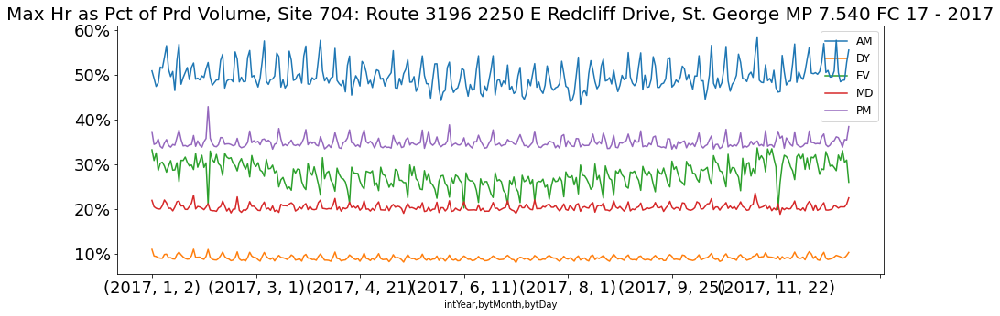

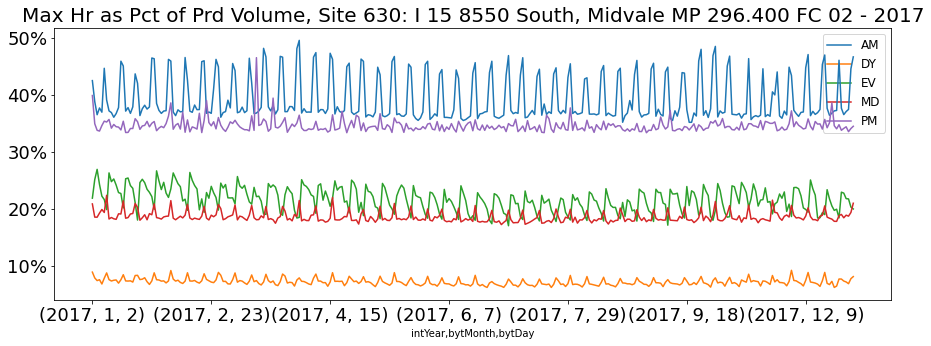

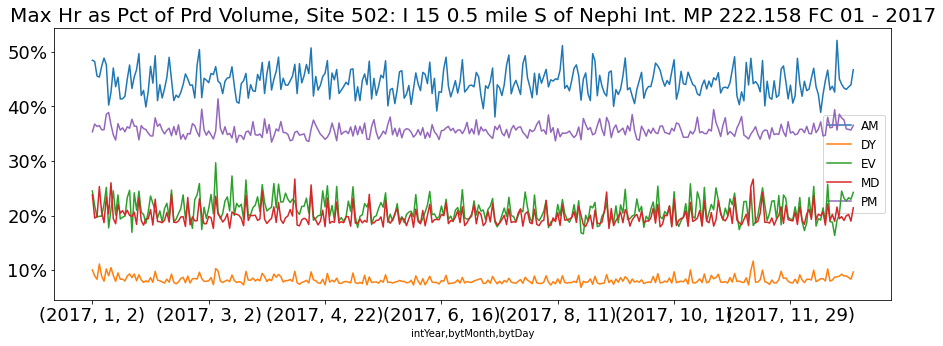

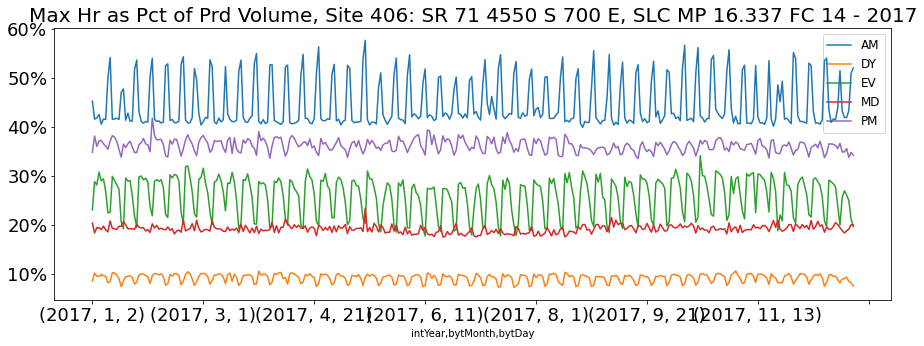

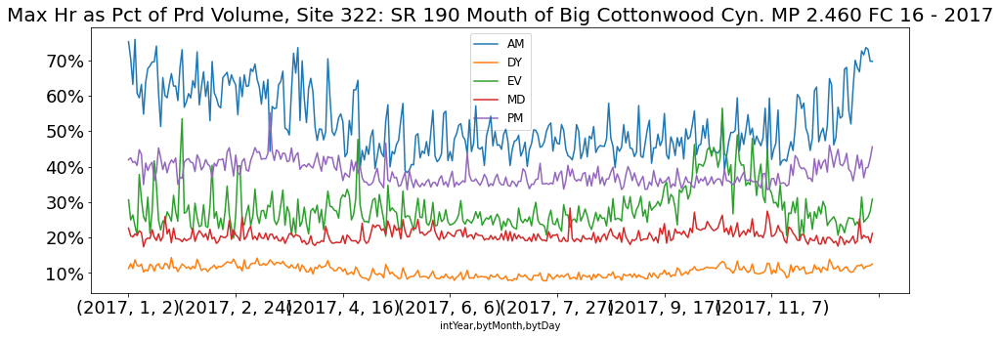

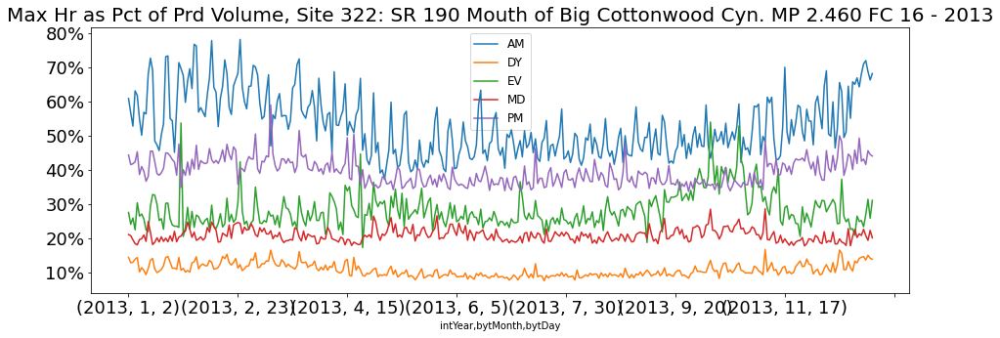

In [21]:
fnPlotSiteYear(704,2017)
fnPlotSiteYear(630,2017)
fnPlotSiteYear(502,2017)
fnPlotSiteYear(406,2017)
fnPlotSiteYear(322,2017)
fnPlotSiteYear(322,2013)

## CCS Groupings

In [23]:
#import groupings

csv_DOWGroups   = os.path.join(dirCCS,  r'tblDOWGroups.csv')
dbf_SeasonGroups = os.path.join(dirCCS,  r'tblMonthGroups.dbf')
csv_SeasonGroups = os.path.join(dirProcessed, r'tblMonthGroups.csv')

dbfToCSV(dbf_SeasonGroups, csv_SeasonGroups)

df_DOWGroups =   pd.read_csv(csv_DOWGroups)
df_SeasonGroups = pd.read_csv(csv_SeasonGroups)

df_SeasonGroups = df_SeasonGroups.drop(columns=['OID_', 'Grouping'])

#rename month group to season group
df_SeasonGroups.columns = ('bytMonth','SeasonGroup')

df_SeasonGroups.loc[(df_SeasonGroups['SeasonGroup'] == 'S01-Winter'), 'SeasonGroup'] = 'S01-Win'
df_SeasonGroups.loc[(df_SeasonGroups['SeasonGroup'] == 'S02-Spring'), 'SeasonGroup'] = 'S02-Spr'
df_SeasonGroups.loc[(df_SeasonGroups['SeasonGroup'] == 'S03-Summer'), 'SeasonGroup'] = 'S03-Sum'
df_SeasonGroups.loc[(df_SeasonGroups['SeasonGroup'] == 'S04-Fall'), 'SeasonGroup'] = 'S04-Fal'

display (df_DOWGroups)
display (df_SeasonGroups)

#Aggregate volume data
df_PrdVol_wGroups = pd.DataFrame.merge(df_PrdVol, df_DOWGroups, on='DOW', how='inner')
df_PrdVol_wGroups = pd.DataFrame.merge(df_PrdVol_wGroups, df_SeasonGroups, on='bytMonth', how='inner')

#Aggregate volume data
df_DyVol_wGroups = pd.DataFrame.merge(df_DyVol, df_DOWGroups, on='DOW', how='inner')
df_DyVol_wGroups = pd.DataFrame.merge(df_DyVol_wGroups, df_SeasonGroups, on='bytMonth', how='inner')

display(df_PrdVol_wGroups)
display(df_DyVol_wGroups)

,DOW,DOWGroup
0,1,W2-Weekend
1,2,W1-Weekday
2,3,W1-Weekday
3,4,W1-Weekday
4,5,W1-Weekday
5,6,W2-Weekend
6,7,W2-Weekend
7,1,7-Sunday
8,2,1-Monday
9,3,2-Tuesday


,bytMonth,SeasonGroup
0,1,M01-Jan
1,2,M02-Feb
2,3,M03-Mar
3,4,M04-Apr
4,5,M05-May
5,6,M06-Jun
6,7,M07-Jul
7,8,M08-Aug
8,9,M09-Sep
9,10,M10-Oct


,SiteID,intYear,bytMonth,bytDay,DOW,Prd,numHrsPrd,VolPrd,VolPkHr,VolPkHrPctPrd,DOWGroup,SeasonGroup
0,301,2013,1,2,4,AM,3,8962,3795,0.423455,W1-Weekday,M01-Jan
1,301,2013,1,2,4,AM,3,8962,3795,0.423455,W1-Weekday,S01-Win
2,301,2013,1,2,4,AM,3,8962,3795,0.423455,W1-Weekday,S00-Ann
3,301,2013,1,2,4,AM,3,8962,3795,0.423455,3-Wednesday,M01-Jan
4,301,2013,1,2,4,AM,3,8962,3795,0.423455,3-Wednesday,S01-Win
...,...,...,...,...,...,...,...,...,...,...,...,...
5450077,714,2017,12,26,3,PM,3,608,240,0.394737,W1-Weekday,S01-Win
5450078,714,2017,12,26,3,PM,3,608,240,0.394737,W1-Weekday,S00-Ann
5450079,714,2017,12,26,3,PM,3,608,240,0.394737,2-Tuesday,M12-Dec
5450080,714,2017,12,26,3,PM,3,608,240,0.394737,2-Tuesday,S01-Win


,SiteID,intYear,bytMonth,bytDay,DOW,numHrsDY,VolDY,DOWGroup,SeasonGroup
0,301,2013,1,2,4,24,48604,W1-Weekday,M01-Jan
1,301,2013,1,2,4,24,48604,W1-Weekday,S01-Win
2,301,2013,1,2,4,24,48604,W1-Weekday,S00-Ann
3,301,2013,1,2,4,24,48604,3-Wednesday,M01-Jan
4,301,2013,1,2,4,24,48604,3-Wednesday,S01-Win
...,...,...,...,...,...,...,...,...,...
1090015,714,2017,12,26,3,24,2449,W1-Weekday,S01-Win
1090016,714,2017,12,26,3,24,2449,W1-Weekday,S00-Ann
1090017,714,2017,12,26,3,24,2449,2-Tuesday,M12-Dec
1090018,714,2017,12,26,3,24,2449,2-Tuesday,S01-Win


In [24]:
def fnPlotSite_DOWSeasonGroup(plotSite, sSeasonGroup, sDOWGroup):
    
    df_plot = df_PrdVol_wGroups.copy()

    df_plot = df_plot[df_plot.SiteID      == plotSite]
    df_plot = df_plot[df_plot.SeasonGroup == sSeasonGroup]
    df_plot = df_plot[df_plot.DOWGroup    == sDOWGroup]

    df_plot = pd.pivot_table(df_plot,
        values='VolPkHrPctPrd',
        index=['intYear','bytMonth','bytDay'],
        columns=['Prd']
        )

    sSiteName = df_Sites_bySeasonSiteGroup.loc[df_Sites_bySeasonSiteGroup['SiteID'] == plotSite]['SiteName'].values[0]
    sTitle = "Max Hr as Pct of Prd Volume, Site " +  sSiteName + " - " + sSeasonGroup + " " + sDOWGroup

    aFigureSize = (15,5)
    iTitleSize = 20
    iLegendSize = 12
    iAxisItemSize = 18
    iAxisTitleSize = 20


    ax = df_plot.plot.line(figsize=aFigureSize, fontsize=iAxisItemSize, zorder=10)

    #set x,y labels
    #ax.set_xlabel(sXAxisLabel, fontsize=iAxisTitleSize)
    #ax.set_ylabel(sYAxisLabel, fontsize=iAxisTitleSize)

    #set title
    ax.set_title(sTitle, fontsize=iTitleSize)
    #add title 
    #display(Markdown("# " + sTitle))

    ax.legend(prop=dict(size=iLegendSize));

    #ax.grid('on', which='major', axis='y', linestyle='-', linewidth=0.5, zorder=1)

    ax.yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:.0%}'))



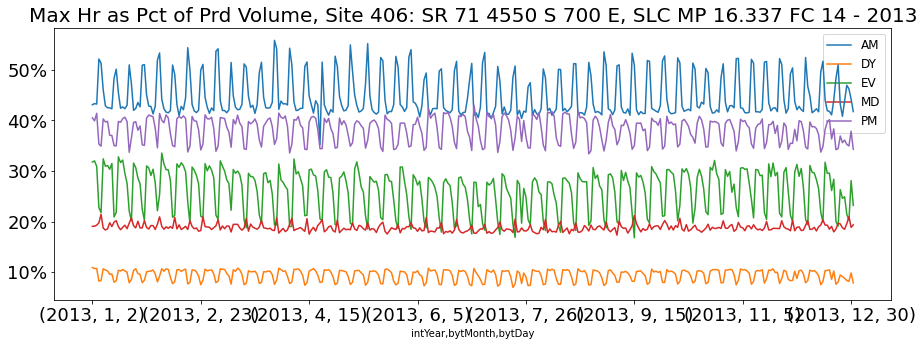

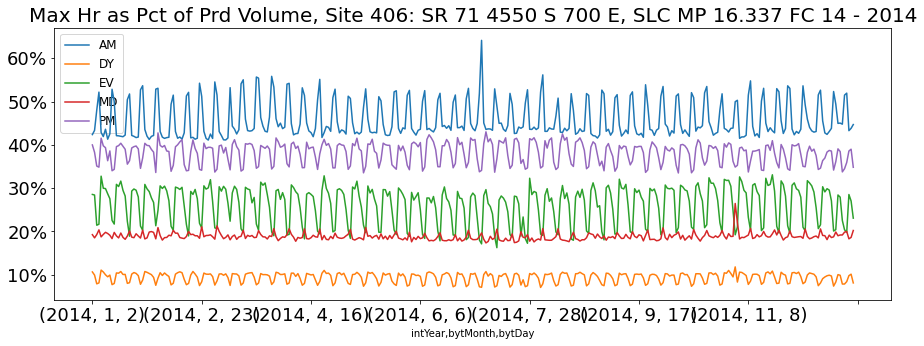

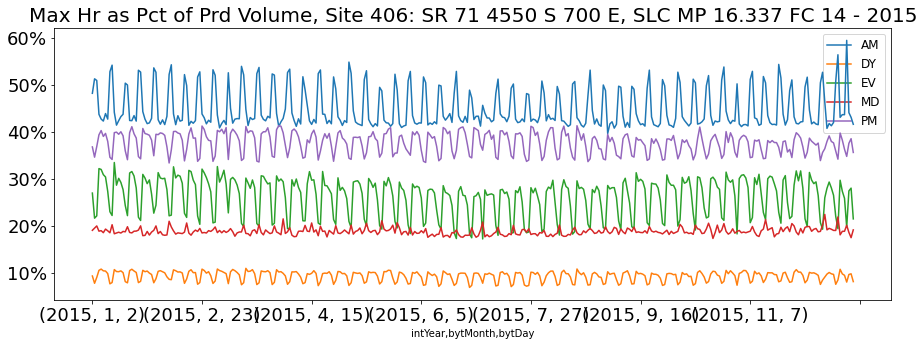

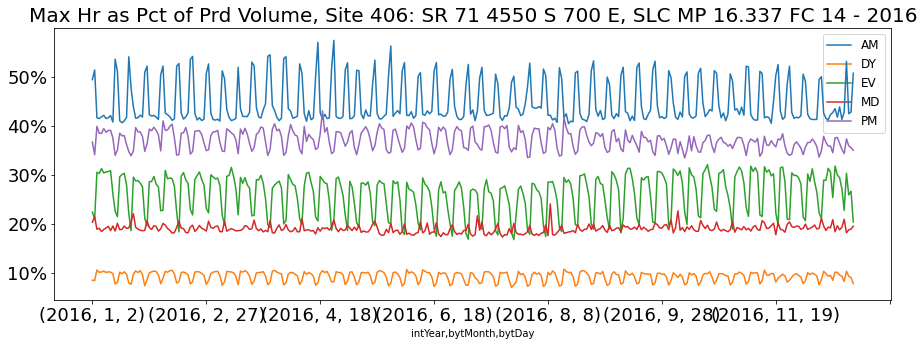

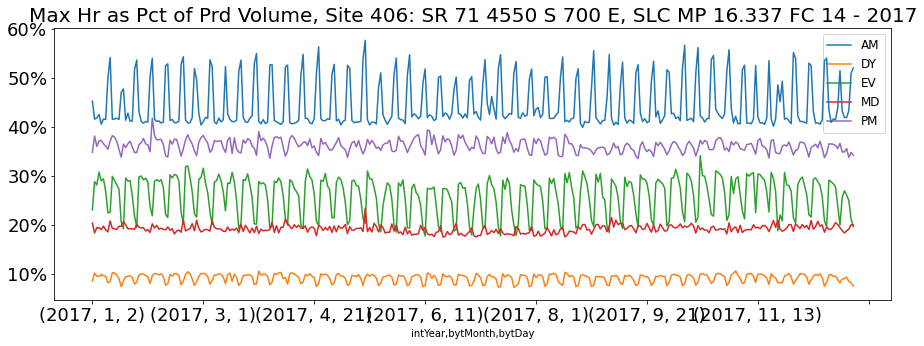

...

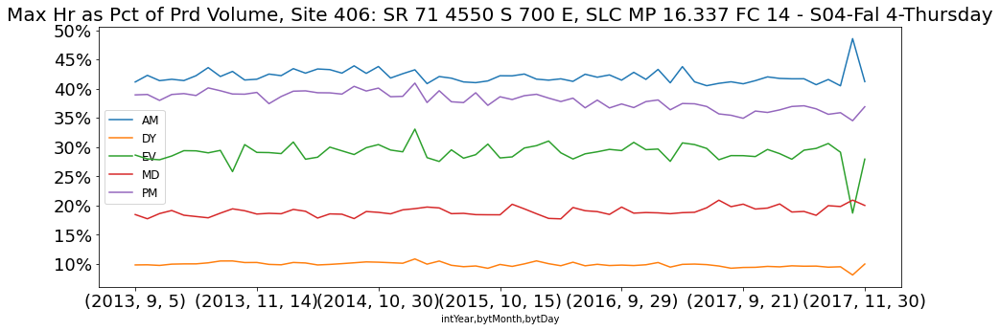

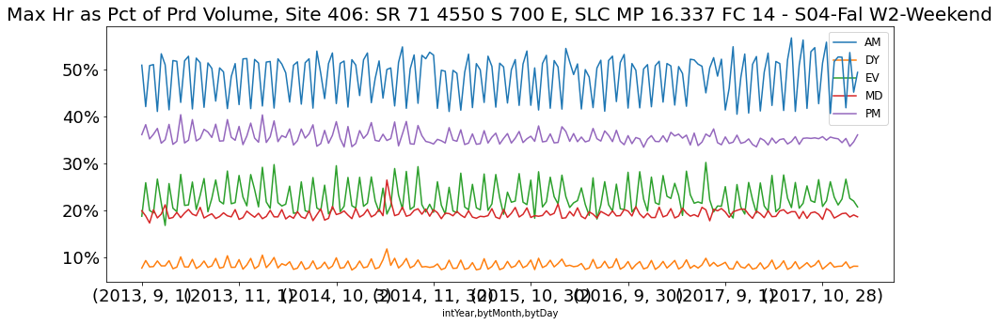

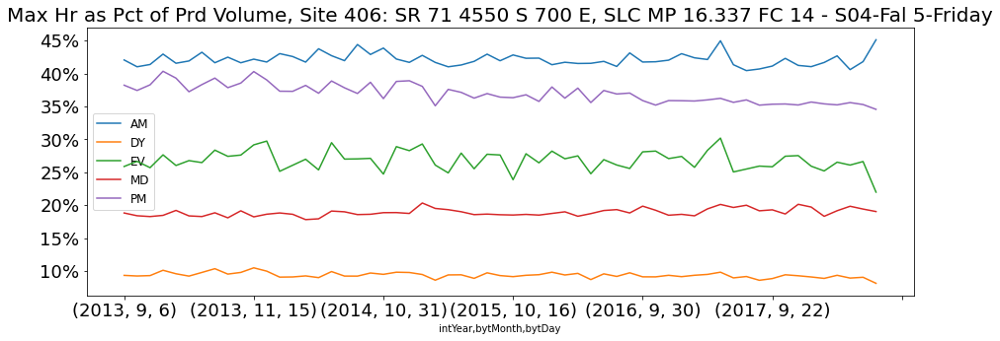

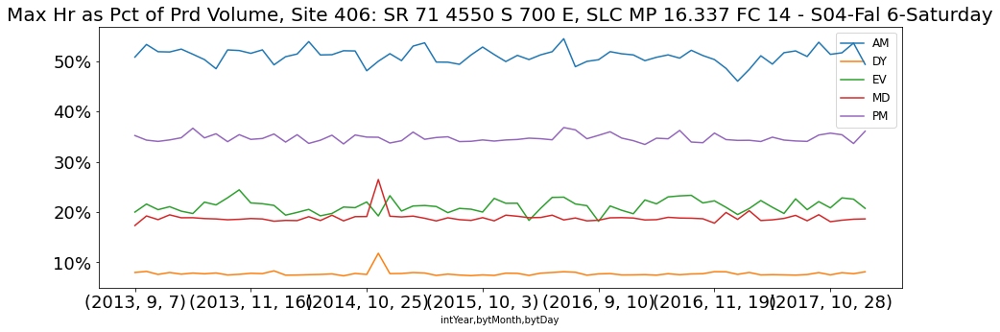

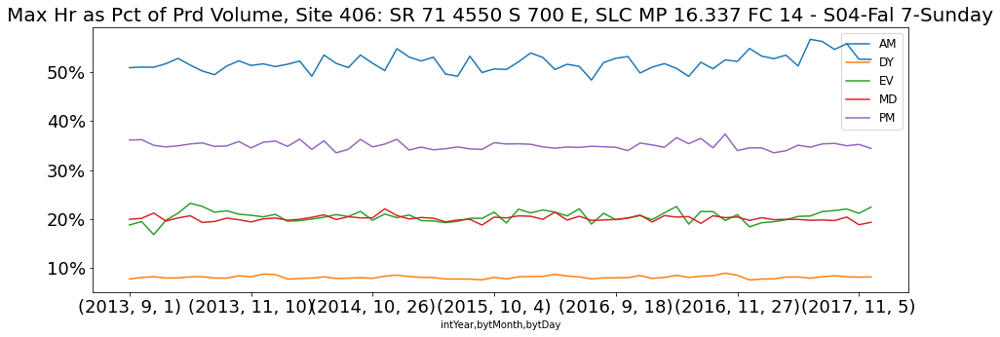

In [25]:
fnPlotSiteYear(406,2013)
fnPlotSiteYear(406,2014)
fnPlotSiteYear(406,2015)
fnPlotSiteYear(406,2016)
fnPlotSiteYear(406,2017)
fnPlotSite_DOWSeasonGroup(406,'S04-Fal','W1-Weekday')
fnPlotSite_DOWSeasonGroup(406,'S04-Fal','1-Monday')
fnPlotSite_DOWSeasonGroup(406,'S04-Fal','2-Tuesday')
fnPlotSite_DOWSeasonGroup(406,'S04-Fal','3-Wednesday')
fnPlotSite_DOWSeasonGroup(406,'S04-Fal','4-Thursday')
fnPlotSite_DOWSeasonGroup(406,'S04-Fal','W2-Weekend')
fnPlotSite_DOWSeasonGroup(406,'S04-Fal','5-Friday')
fnPlotSite_DOWSeasonGroup(406,'S04-Fal','6-Saturday')
fnPlotSite_DOWSeasonGroup(406,'S04-Fal','7-Sunday')

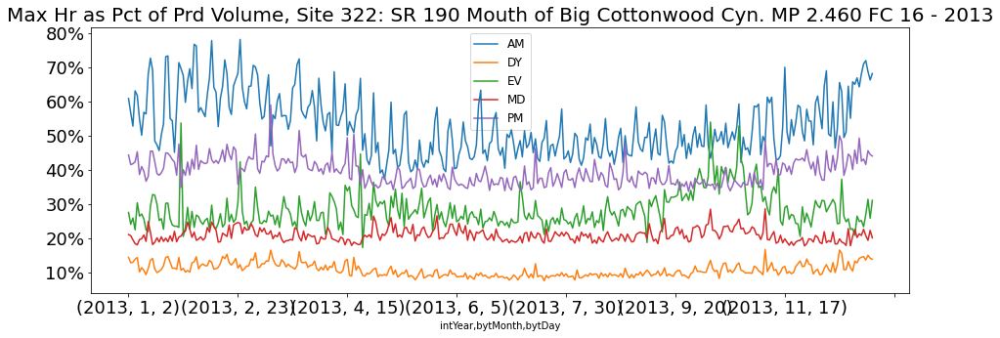

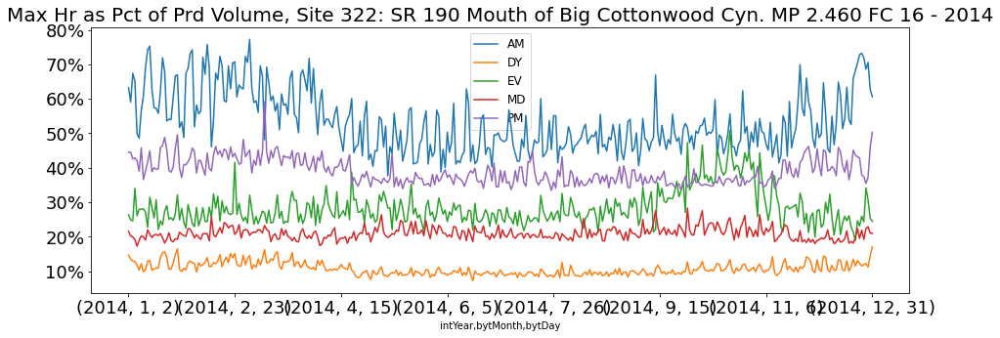

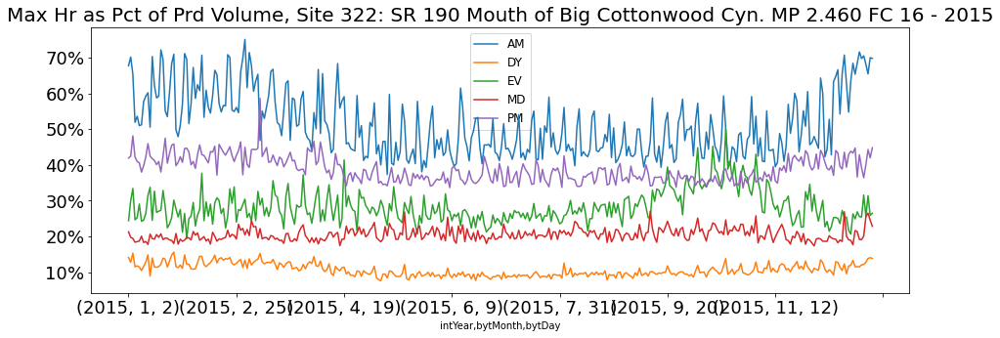

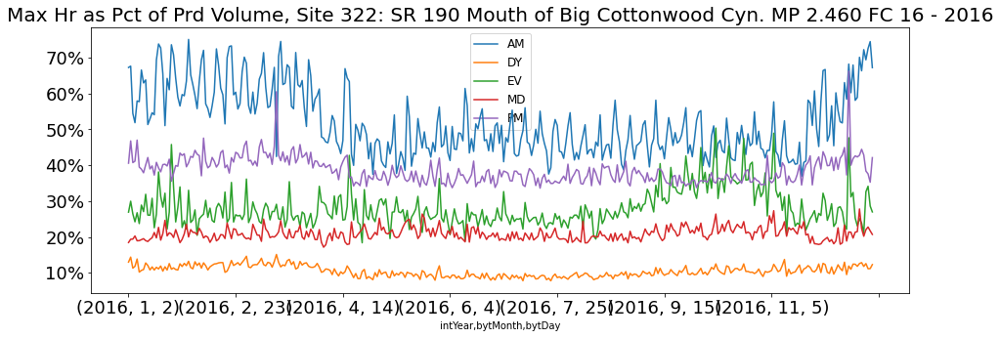

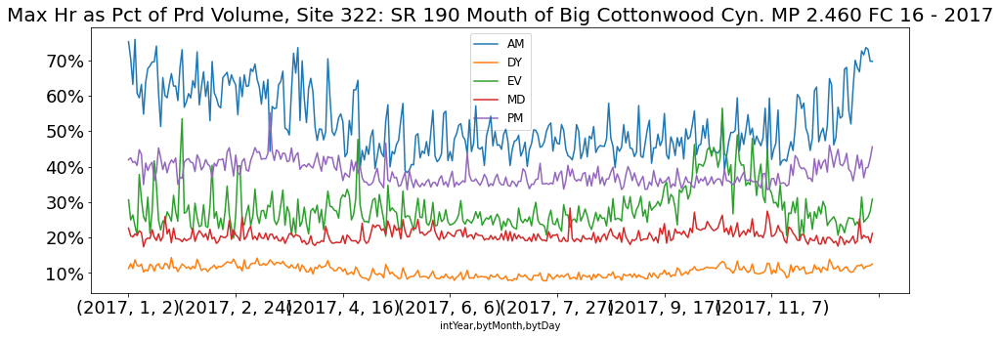

...

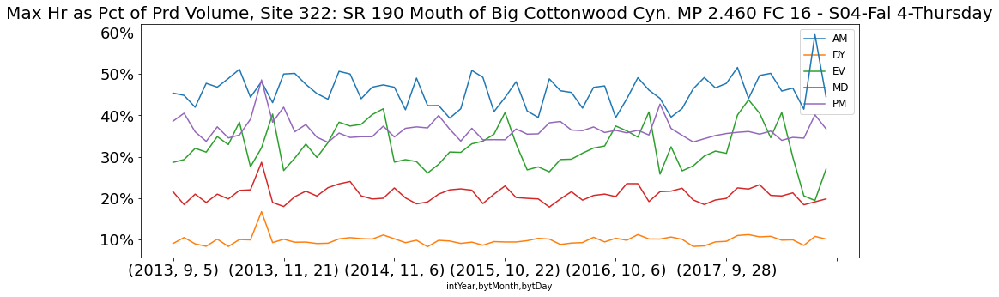

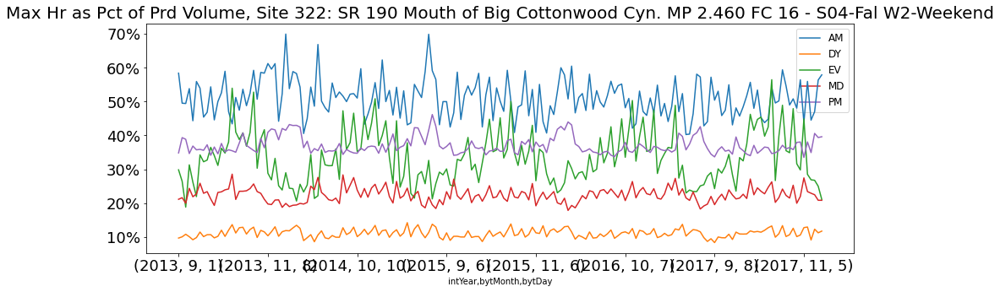

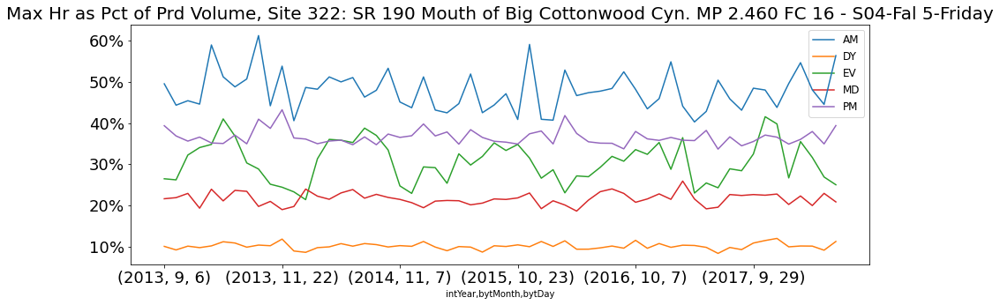

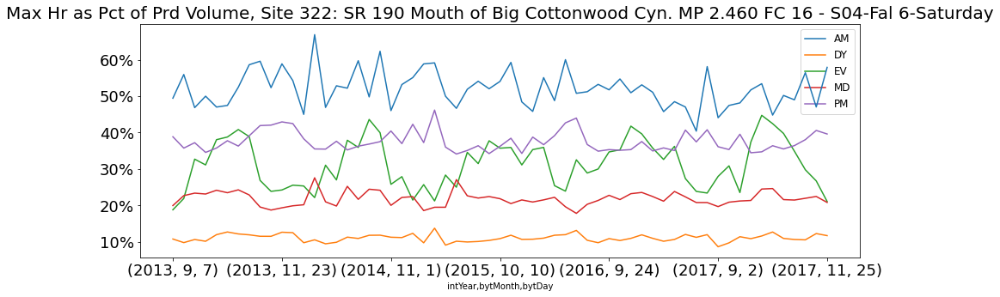

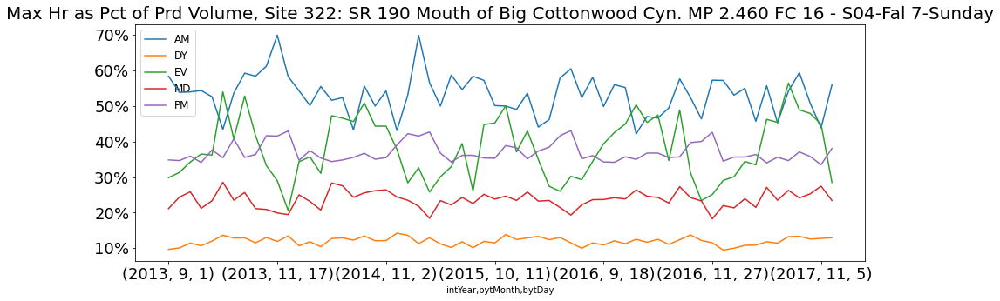

In [26]:
fnPlotSiteYear(322,2013)
fnPlotSiteYear(322,2014)
fnPlotSiteYear(322,2015)
fnPlotSiteYear(322,2016)
fnPlotSiteYear(322,2017)
fnPlotSite_DOWSeasonGroup(322,'S04-Fal','W1-Weekday')
fnPlotSite_DOWSeasonGroup(322,'S04-Fal','1-Monday')
fnPlotSite_DOWSeasonGroup(322,'S04-Fal','2-Tuesday')
fnPlotSite_DOWSeasonGroup(322,'S04-Fal','3-Wednesday')
fnPlotSite_DOWSeasonGroup(322,'S04-Fal','4-Thursday')
fnPlotSite_DOWSeasonGroup(322,'S04-Fal','W2-Weekend')
fnPlotSite_DOWSeasonGroup(322,'S04-Fal','5-Friday')
fnPlotSite_DOWSeasonGroup(322,'S04-Fal','6-Saturday')
fnPlotSite_DOWSeasonGroup(322,'S04-Fal','7-Sunday')

## Combined Prd Data by Site into SiteGroup

In [27]:
df_PrdVol_wSiteGroups = pd.DataFrame.merge(df_PrdVol_wGroups, df_Sites_bySeasonSiteGroup, on='SiteID', how='inner')
display(df_PrdVol_wSiteGroups)

df_DyVol_wSiteGroups = pd.DataFrame.merge(df_DyVol_wGroups, df_Sites_bySeasonSiteGroup, on='SiteID', how='inner')

display(df_DyVol_wSiteGroups)

,SiteID,intYear,bytMonth,bytDay,DOW,Prd,numHrsPrd,VolPrd,VolPkHr,VolPkHrPctPrd,DOWGroup,SeasonGroup,SiteGroupSeason,SiteName
0,301,2013,1,2,4,AM,3,8962,3795,0.423455,W1-Weekday,M01-Jan,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
1,301,2013,1,2,4,AM,3,8962,3795,0.423455,W1-Weekday,S01-Win,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
2,301,2013,1,2,4,AM,3,8962,3795,0.423455,W1-Weekday,S00-Ann,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
3,301,2013,1,2,4,AM,3,8962,3795,0.423455,3-Wednesday,M01-Jan,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
4,301,2013,1,2,4,AM,3,8962,3795,0.423455,3-Wednesday,S01-Win,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5444617,714,2017,12,26,3,PM,3,608,240,0.394737,W1-Weekday,S01-Win,SNW,"714: SR 7, Southern Parkway, St. George MP 6.910"
5444618,714,2017,12,26,3,PM,3,608,240,0.394737,W1-Weekday,S00-Ann,SNW,"714: SR 7, Southern Parkway, St. George MP 6.910"
5444619,714,2017,12,26,3,PM,3,608,240,0.394737,2-Tuesday,M12-Dec,SNW,"714: SR 7, Southern Parkway, St. George MP 6.910"
5444620,714,2017,12,26,3,PM,3,608,240,0.394737,2-Tuesday,S01-Win,SNW,"714: SR 7, Southern Parkway, St. George MP 6.910"


,SiteID,intYear,bytMonth,bytDay,DOW,numHrsDY,VolDY,DOWGroup,SeasonGroup,SiteGroupSeason,SiteName
0,301,2013,1,2,4,24,48604,W1-Weekday,M01-Jan,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
1,301,2013,1,2,4,24,48604,W1-Weekday,S01-Win,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
2,301,2013,1,2,4,24,48604,W1-Weekday,S00-Ann,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
3,301,2013,1,2,4,24,48604,3-Wednesday,M01-Jan,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
4,301,2013,1,2,4,24,48604,3-Wednesday,S01-Win,SNA,"301: I 80 1 mile E of I 215 Int., Parleys Cany..."
...,...,...,...,...,...,...,...,...,...,...,...
1088923,714,2017,12,26,3,24,2449,W1-Weekday,S01-Win,SNW,"714: SR 7, Southern Parkway, St. George MP 6.910"
1088924,714,2017,12,26,3,24,2449,W1-Weekday,S00-Ann,SNW,"714: SR 7, Southern Parkway, St. George MP 6.910"
1088925,714,2017,12,26,3,24,2449,2-Tuesday,M12-Dec,SNW,"714: SR 7, Southern Parkway, St. George MP 6.910"
1088926,714,2017,12,26,3,24,2449,2-Tuesday,S01-Win,SNW,"714: SR 7, Southern Parkway, St. George MP 6.910"


In [28]:
#AGGREGATE OVER SITES
#preserve year,month,day values to display change of factor over time. will aggregate later to final dataset

df_PrdSiteGroupVol = df_PrdVol_wSiteGroups.groupby(['SiteGroupSeason','DOWGroup','SeasonGroup','intYear','bytMonth','bytDay','DOW','Prd'], as_index=False).agg({'VolPrd':[np.sum],'VolPkHr':[np.sum],'SiteID':[np.size]})
df_PrdSiteGroupVol.columns = (['SiteGroupSeason','DOWGroup','SeasonGroup','intYear','bytMonth','bytDay','DOW','Prd','VolPrdSum','VolPkHrSum','numSites'])
df_PrdSiteGroupVol['VolPkHrPctPrd'] = df_PrdSiteGroupVol['VolPkHrSum'] / df_PrdSiteGroupVol['VolPrdSum']
display(df_PrdSiteGroupVol)

df_DySiteGroupVol = df_DyVol_wSiteGroups.groupby(['SiteGroupSeason','DOWGroup','SeasonGroup','intYear','bytMonth','bytDay','DOW'], as_index=False).agg({'VolDY':[np.sum],'SiteID':[np.size]})
df_DySiteGroupVol.columns = (['SiteGroupSeason','DOWGroup','SeasonGroup','intYear','bytMonth','bytDay','DOW','VolDYSum','numSites'])
display(df_DySiteGroupVol)

df_PrdSiteGroupVol_wDY = pd.DataFrame.merge(df_PrdSiteGroupVol,df_DySiteGroupVol,on=(['SiteGroupSeason','DOWGroup','SeasonGroup','intYear','bytMonth','bytDay','DOW','numSites']),how='inner')
df_PrdSiteGroupVol_wDY['VolPkHrPctDY'] = df_PrdSiteGroupVol_wDY['VolPkHrSum'] / df_PrdSiteGroupVol_wDY['VolDYSum']
display(df_PrdSiteGroupVol_wDY)

,SiteGroupSeason,DOWGroup,SeasonGroup,intYear,bytMonth,bytDay,DOW,Prd,VolPrdSum,VolPkHrSum,numSites,VolPkHrPctPrd
0,SN0,1-Monday,M01-Jan,2013,1,7,2,AM,15,8,2,0.533333
1,SN0,1-Monday,M01-Jan,2013,1,7,2,DY,275,38,2,0.138182
2,SN0,1-Monday,M01-Jan,2013,1,7,2,EV,37,10,2,0.270270
3,SN0,1-Monday,M01-Jan,2013,1,7,2,MD,143,34,2,0.237762
4,SN0,1-Monday,M01-Jan,2013,1,7,2,PM,80,38,2,0.475000
...,...,...,...,...,...,...,...,...,...,...,...,...
1669615,SNX,W2-Weekend,S04-Fal,2017,11,25,7,AM,7441,3724,2,0.500470
1669616,SNX,W2-Weekend,S04-Fal,2017,11,25,7,DY,96386,7914,2,0.082107
1669617,SNX,W2-Weekend,S04-Fal,2017,11,25,7,EV,24924,6027,2,0.241815
1669618,SNX,W2-Weekend,S04-Fal,2017,11,25,7,MD,42210,7914,2,0.187491


,SiteGroupSeason,DOWGroup,SeasonGroup,intYear,bytMonth,bytDay,DOW,VolDYSum,numSites
0,SN0,1-Monday,M01-Jan,2013,1,7,2,275,2
1,SN0,1-Monday,M01-Jan,2013,1,14,2,242,2
2,SN0,1-Monday,M01-Jan,2013,1,28,2,332,2
3,SN0,1-Monday,M01-Jan,2014,1,6,2,394,2
4,SN0,1-Monday,M01-Jan,2014,1,13,2,331,2
...,...,...,...,...,...,...,...,...,...
333919,SNX,W2-Weekend,S04-Fal,2017,11,12,1,99763,3
333920,SNX,W2-Weekend,S04-Fal,2017,11,17,6,90131,2
333921,SNX,W2-Weekend,S04-Fal,2017,11,18,7,119315,3
333922,SNX,W2-Weekend,S04-Fal,2017,11,24,6,119385,3


,SiteGroupSeason,DOWGroup,SeasonGroup,intYear,bytMonth,bytDay,DOW,Prd,VolPrdSum,VolPkHrSum,numSites,VolPkHrPctPrd,VolDYSum,VolPkHrPctDY
0,SN0,1-Monday,M01-Jan,2013,1,7,2,AM,15,8,2,0.533333,275,0.029091
1,SN0,1-Monday,M01-Jan,2013,1,7,2,DY,275,38,2,0.138182,275,0.138182
2,SN0,1-Monday,M01-Jan,2013,1,7,2,EV,37,10,2,0.270270,275,0.036364
3,SN0,1-Monday,M01-Jan,2013,1,7,2,MD,143,34,2,0.237762,275,0.123636
4,SN0,1-Monday,M01-Jan,2013,1,7,2,PM,80,38,2,0.475000,275,0.138182
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1669597,SNX,W2-Weekend,S04-Fal,2017,11,25,7,AM,7441,3724,2,0.500470,96386,0.038636
1669598,SNX,W2-Weekend,S04-Fal,2017,11,25,7,DY,96386,7914,2,0.082107,96386,0.082107
1669599,SNX,W2-Weekend,S04-Fal,2017,11,25,7,EV,24924,6027,2,0.241815,96386,0.062530
1669600,SNX,W2-Weekend,S04-Fal,2017,11,25,7,MD,42210,7914,2,0.187491,96386,0.082107


In [29]:
def fnPlotSiteGroup_DOWSeasonGroup(plotSiteGroup, sSeasonGroup, sDOWGroup, sPrdOrDY):
    
    df_plot = df_PrdSiteGroupVol_wDY.copy()

    df_plot = df_plot[df_plot.SiteGroupSeason   == plotSiteGroup]
    df_plot = df_plot[df_plot.SeasonGroup       == sSeasonGroup]
    df_plot = df_plot[df_plot.DOWGroup          == sDOWGroup]

    if sPrdOrDY == 'Prd':
        sValue = 'VolPkHrPctPrd'
    elif sPrdOrDY == 'DY':
        sValue = 'VolPkHrPctDY'        
    
    df_plot = pd.pivot_table(df_plot,
        values=sValue,
        index=['intYear','bytMonth','bytDay'],
        columns=['Prd']
        )

    sSiteName = df_SeasonSiteGroups.loc[df_SeasonSiteGroups['SiteGroupSeason'] == plotSiteGroup]['SsnGrp'].values[0] + ' - ' + df_SeasonSiteGroups.loc[df_SeasonSiteGroups['SiteGroupSeason'] == plotSiteGroup]['SsnVolCls'].values[0] + ' - ' +df_SeasonSiteGroups.loc[df_SeasonSiteGroups['SiteGroupSeason'] == plotSiteGroup]['SsnATGroup'].values[0]
    sTitle = sValue + ": " + str(plotSiteGroup) + ": " +  sSiteName + " - " + sSeasonGroup + " " + sDOWGroup

    aFigureSize = (15,5)
    iTitleSize = 20
    iLegendSize = 12
    iAxisItemSize = 18
    iAxisTitleSize = 20


    ax = df_plot.plot.line(figsize=aFigureSize, fontsize=iAxisItemSize, zorder=10)

    #set x,y labels
    #ax.set_xlabel(sXAxisLabel, fontsize=iAxisTitleSize)
    #ax.set_ylabel(sYAxisLabel, fontsize=iAxisTitleSize)

    #set title
    ax.set_title(sTitle, fontsize=iTitleSize)
    #add title 
    #display(Markdown("# " + sTitle))

    ax.legend(prop=dict(size=iLegendSize));

    #ax.grid('on', which='major', axis='y', linestyle='-', linewidth=0.5, zorder=1)

    if sPrdOrDY == 'Prd':
        ax.yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:.0%}'))
    elif sPrdOrDY == 'DY':
        ax.yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:.1%}'))  
    


In [30]:
df_SeasonSiteGroups

,SiteGroupSeason,SsnGrp,SsnATGroup,SsnVolCls
0,SN0,AlpineLoop,0-AllAreaTypes,0-AllVolumes
1,SN1,BearLake,0-AllAreaTypes,0-AllVolumes
2,SN2,BigCottonwood,0-AllAreaTypes,0-AllVolumes
3,SN3,CedarBreaks,0-AllAreaTypes,0-AllVolumes
4,SN4,FreewayI15,1-Rural,0-AllVolumes
5,SN5,FreewayI15,2-Transition,0-AllVolumes
6,SN6,FreewayI15,3-Suburban,0-AllVolumes
7,SN7,FreewayI15,4-Urban,0-AllVolumes
8,XX1,FreewayI15,5-CBD,0-AllVolumes
9,SN8,FreewayI215,0-AllAreaTypes,0-AllVolumes


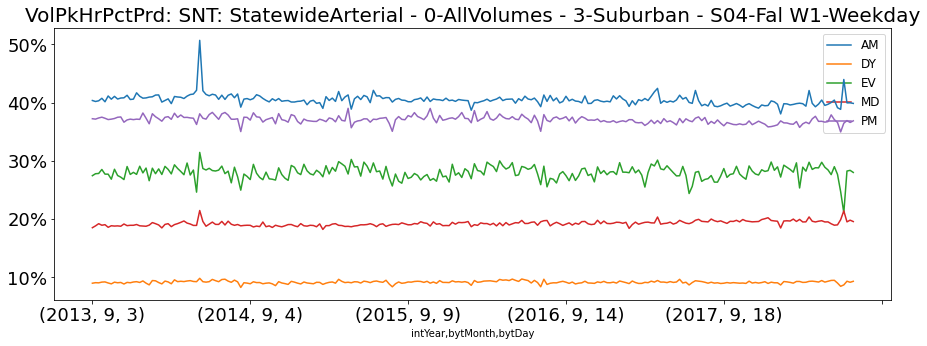

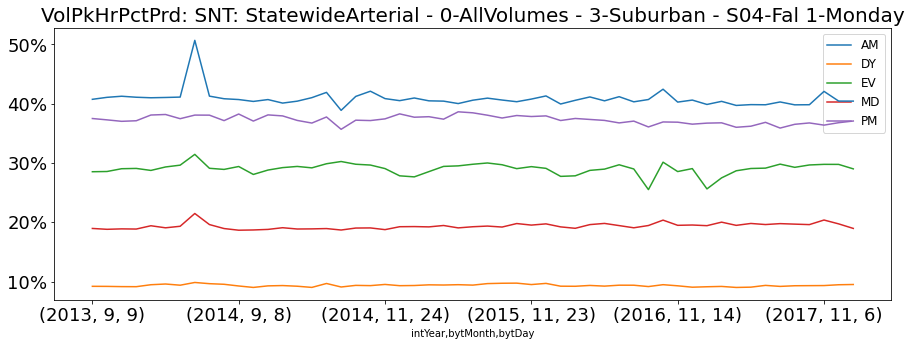

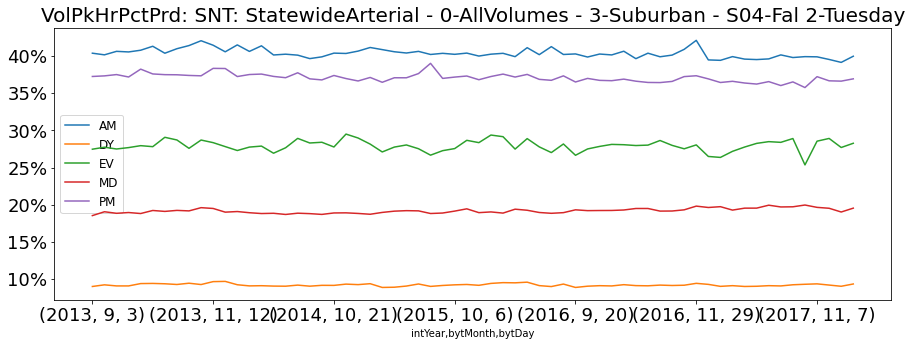

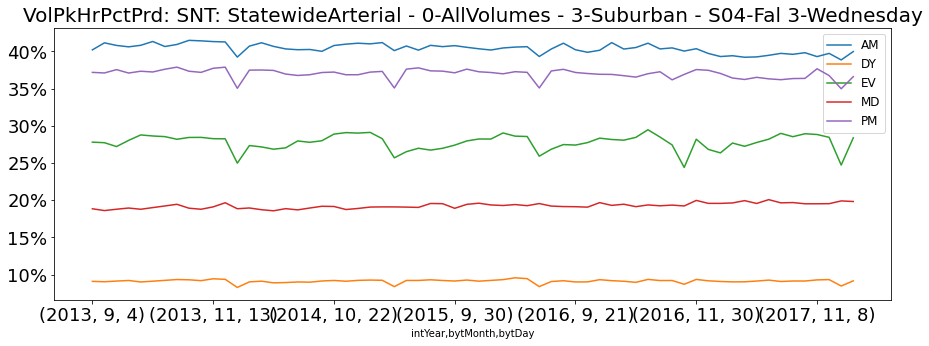

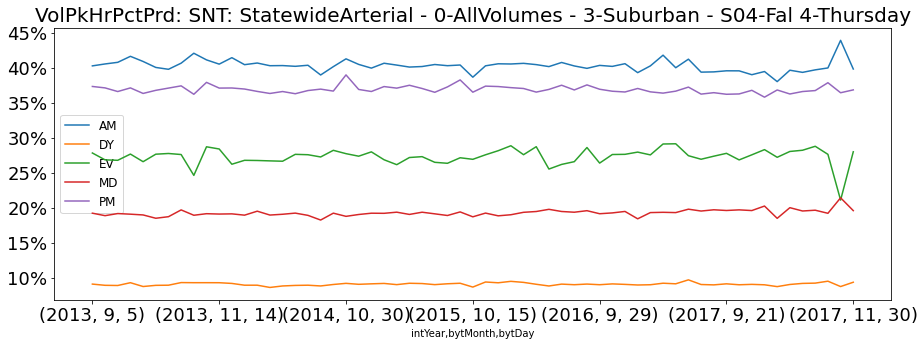

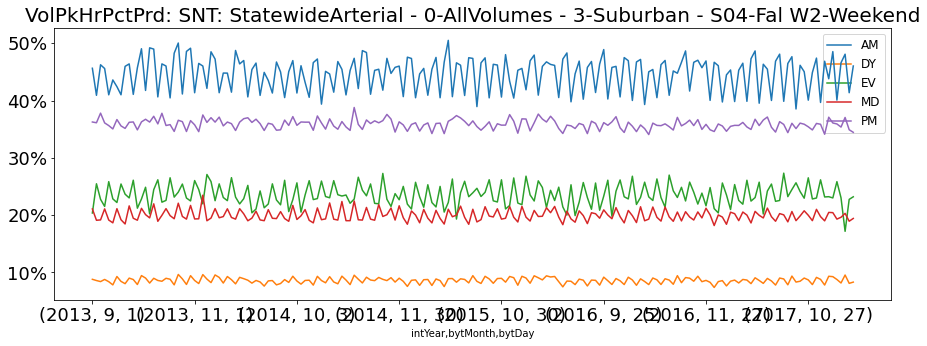

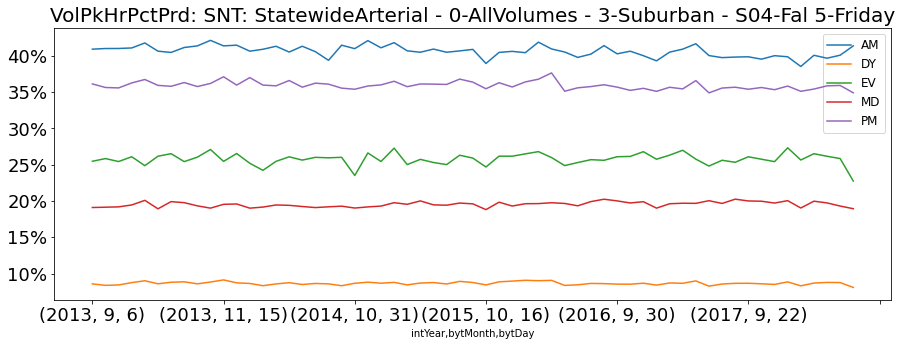

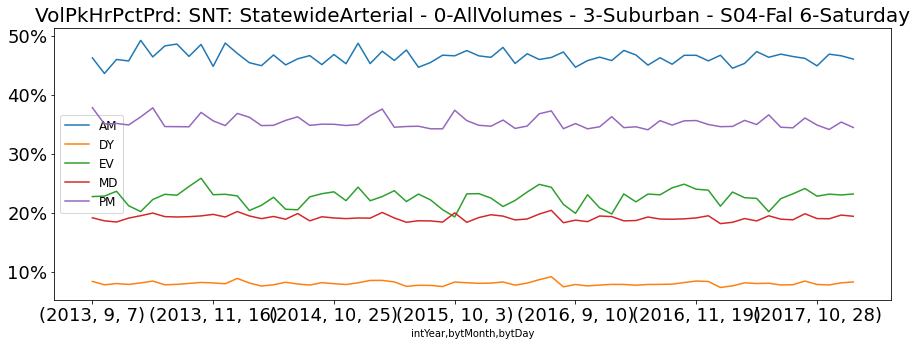

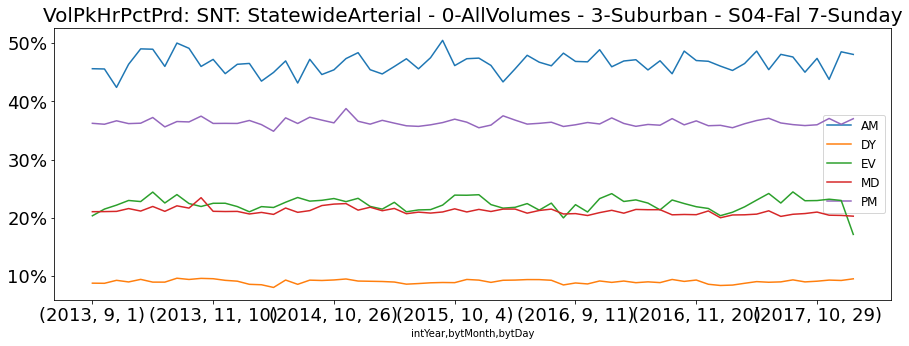

In [31]:
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','W1-Weekday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','1-Monday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','2-Tuesday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','3-Wednesday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','4-Thursday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','W2-Weekend','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','5-Friday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','6-Saturday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','7-Sunday','Prd')

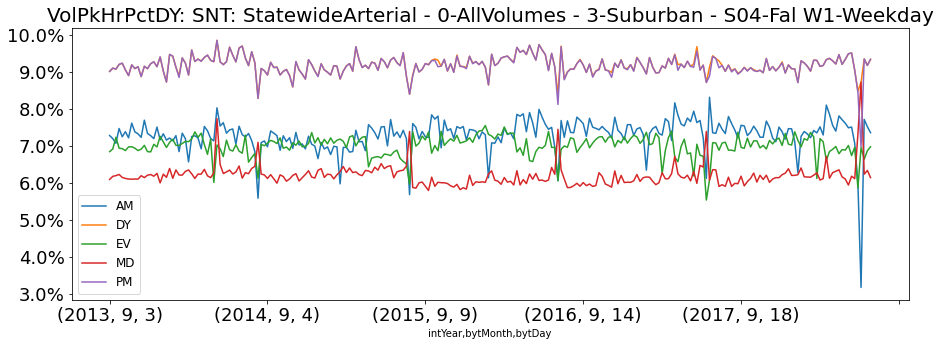

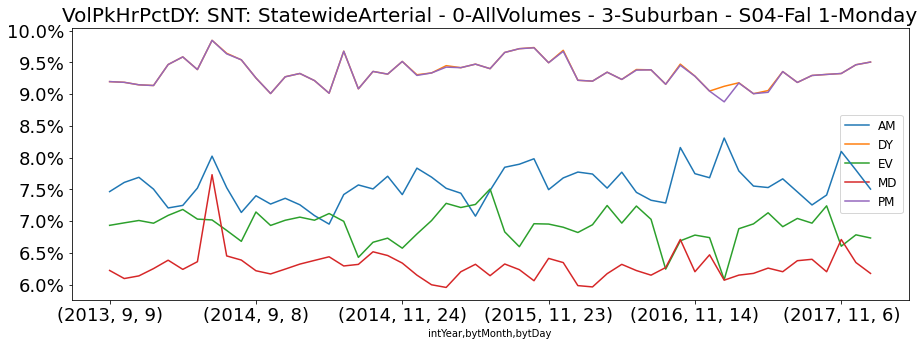

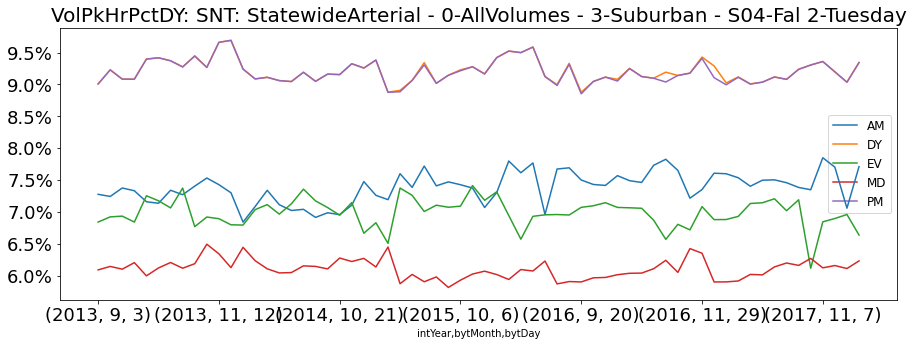

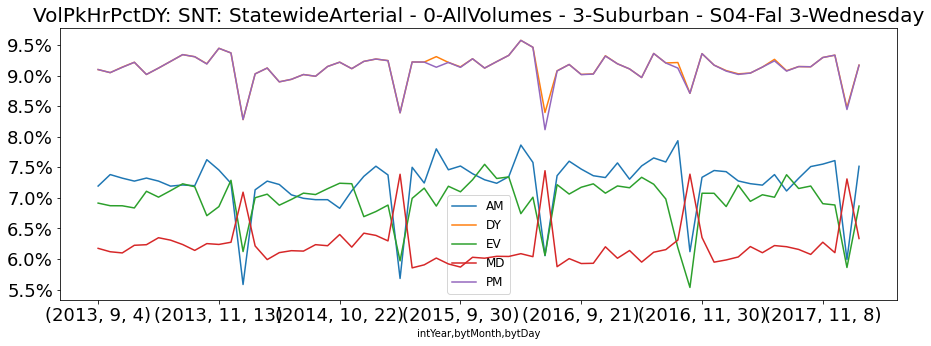

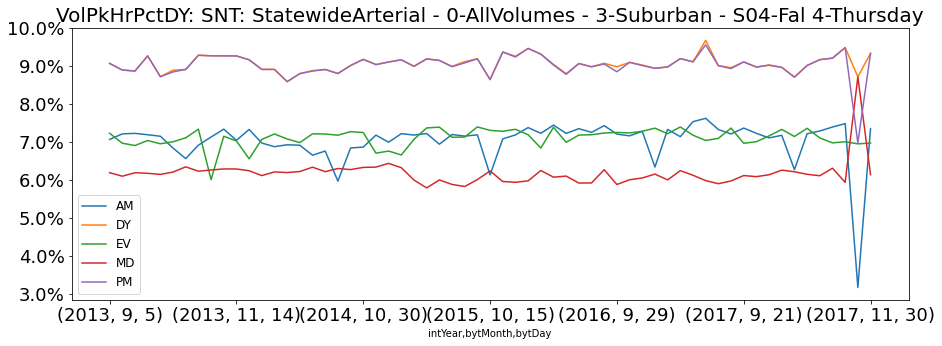

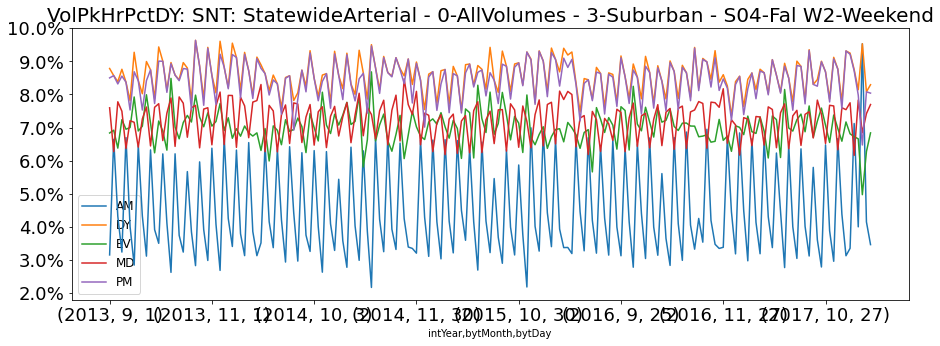

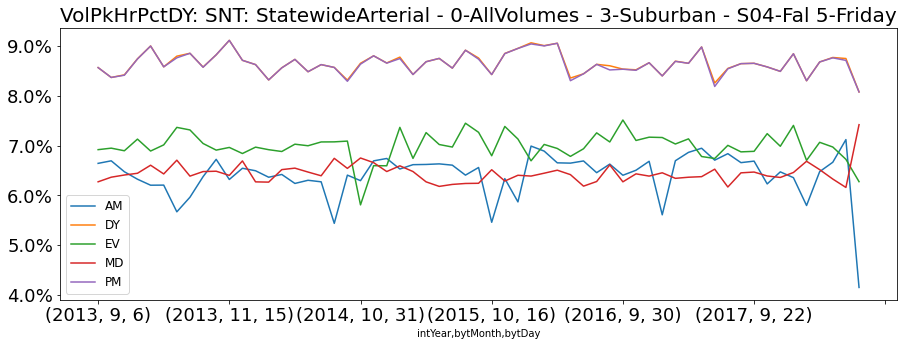

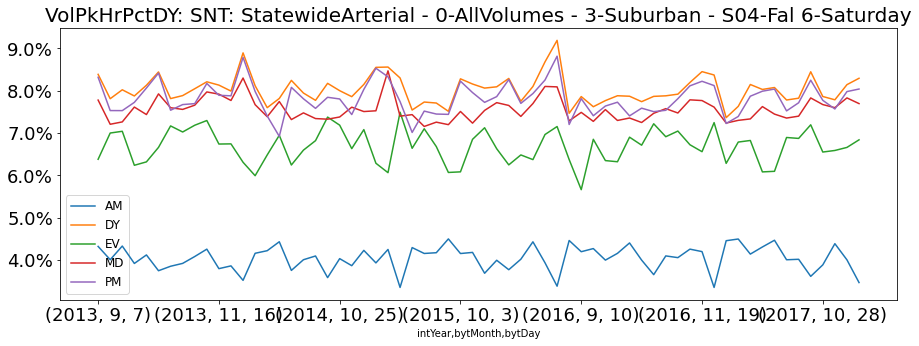

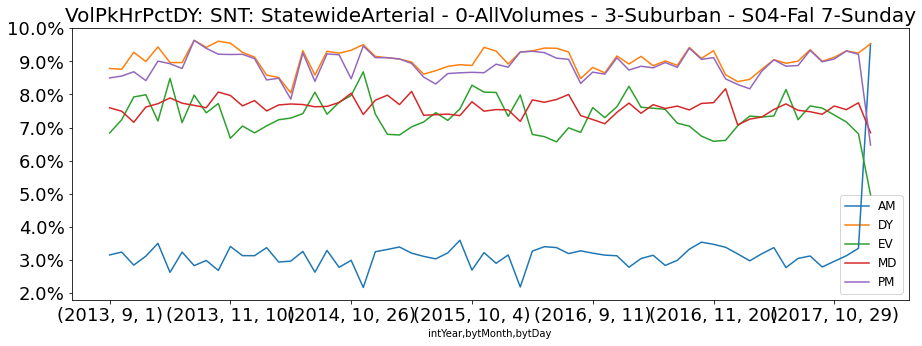

In [32]:
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','W1-Weekday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','1-Monday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','2-Tuesday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','3-Wednesday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','4-Thursday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','W2-Weekend','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','5-Friday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','6-Saturday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNT','S04-Fal','7-Sunday','DY')

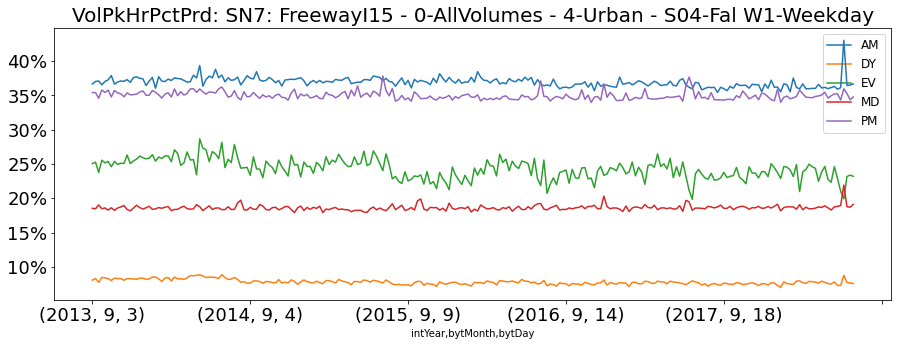

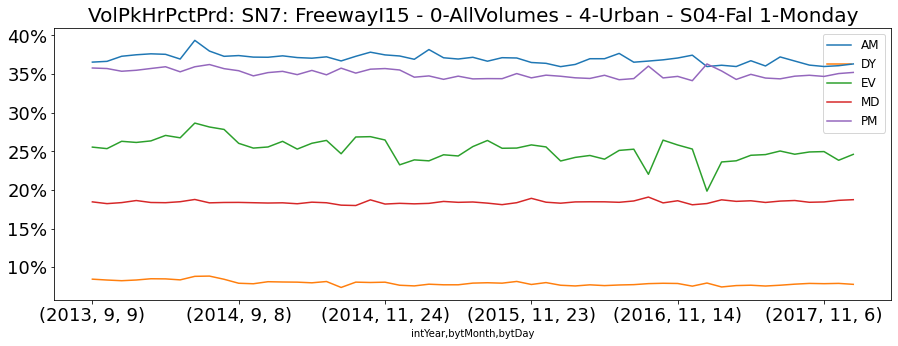

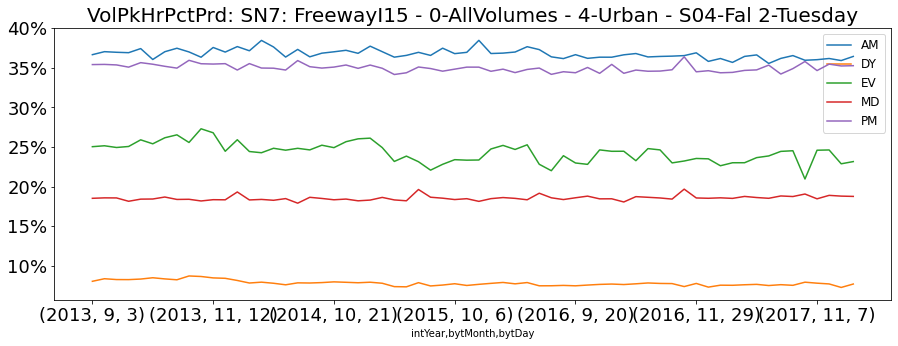

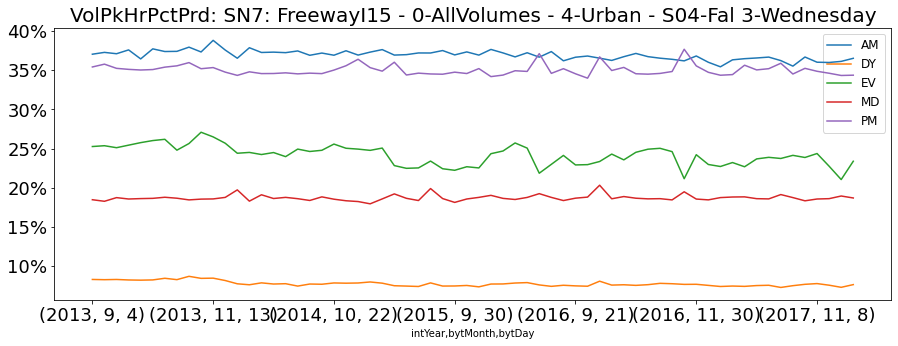

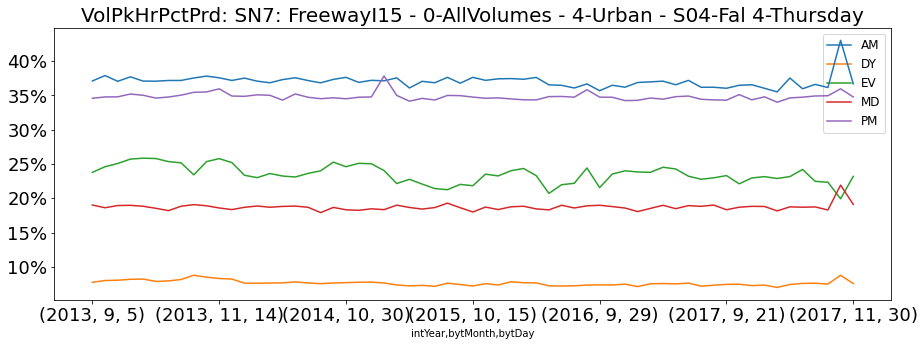

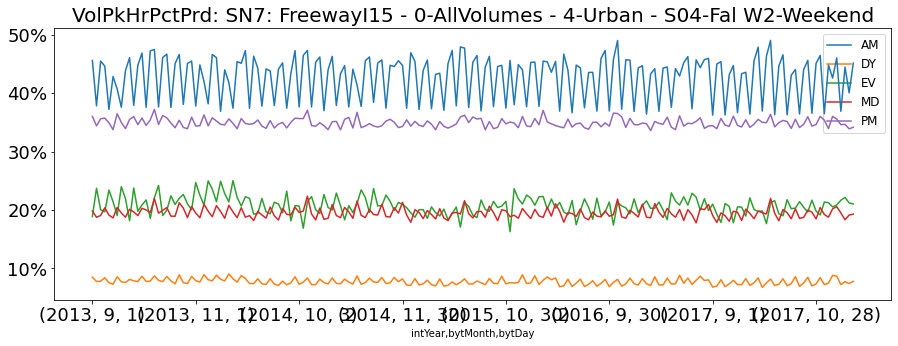

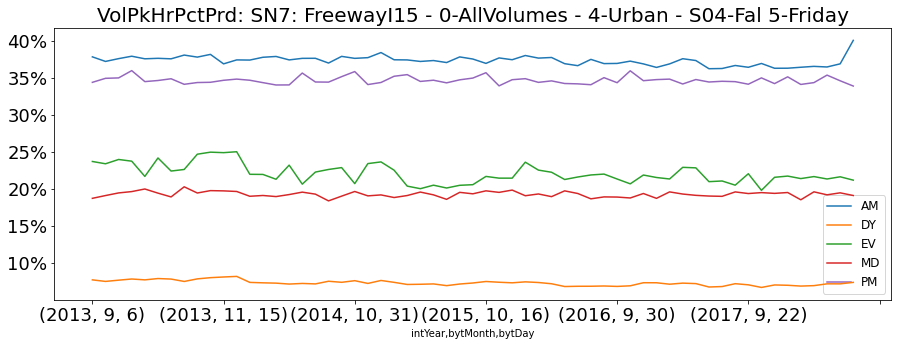

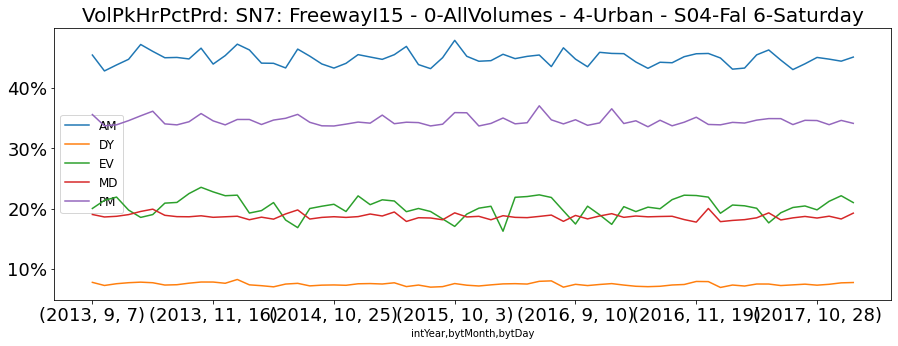

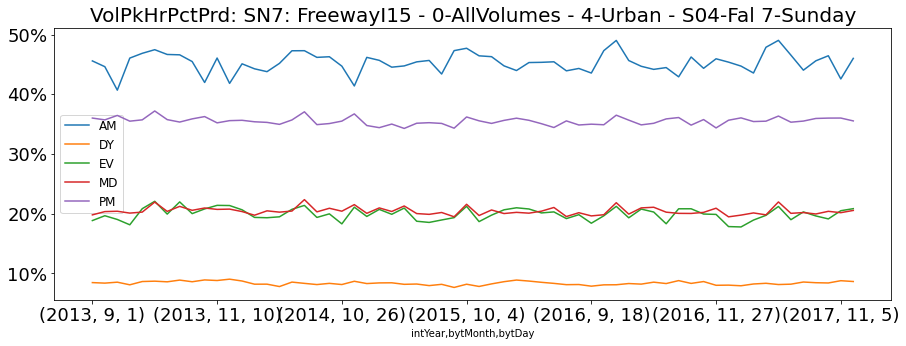

In [33]:
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','W1-Weekday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','1-Monday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','2-Tuesday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','3-Wednesday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','4-Thursday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','W2-Weekend','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','5-Friday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','6-Saturday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','7-Sunday','Prd')

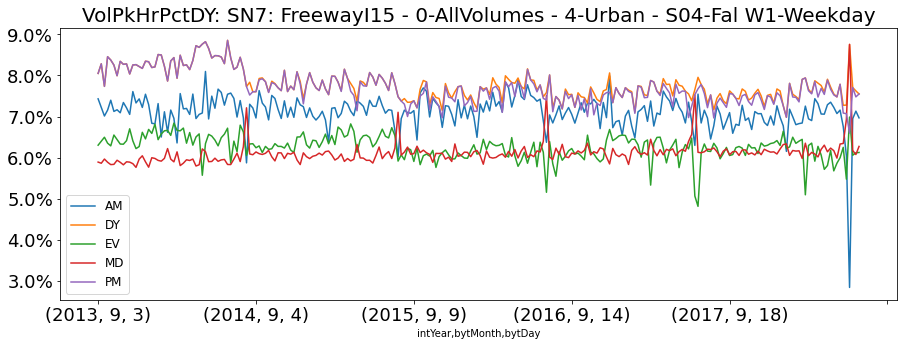

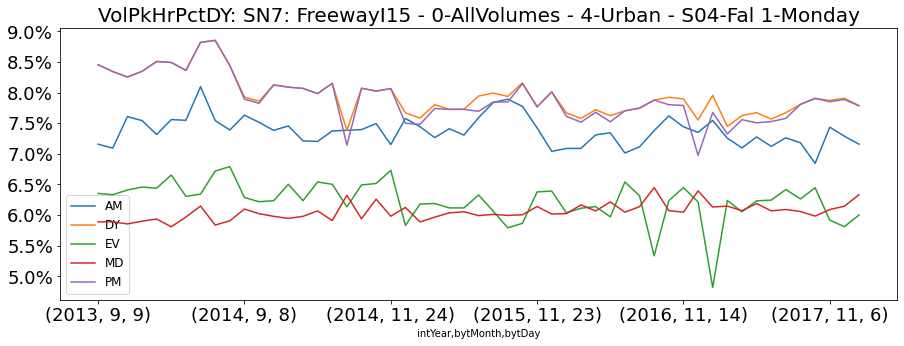

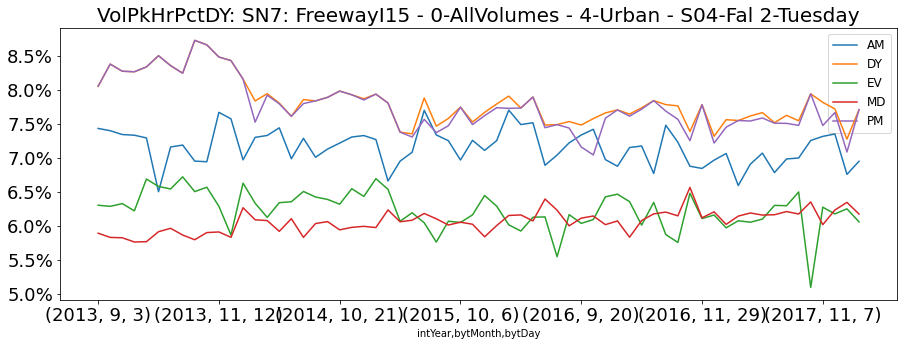

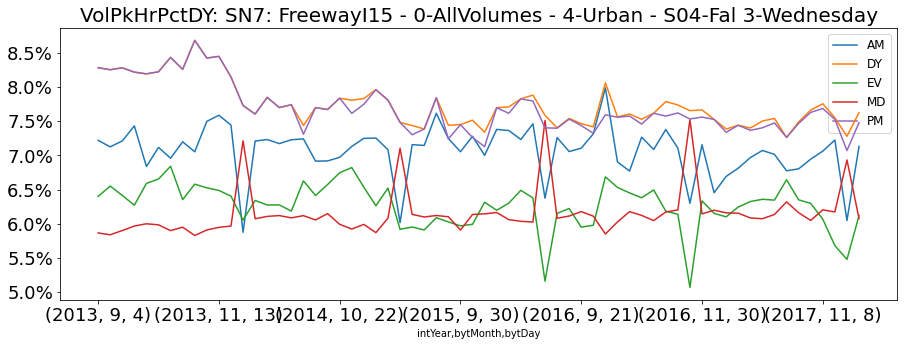

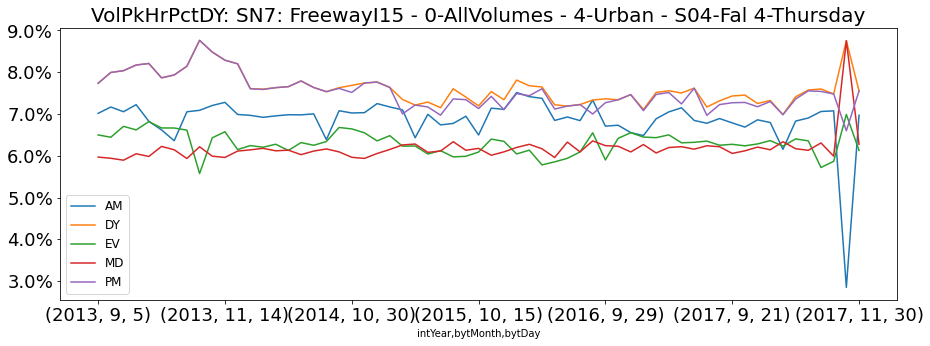

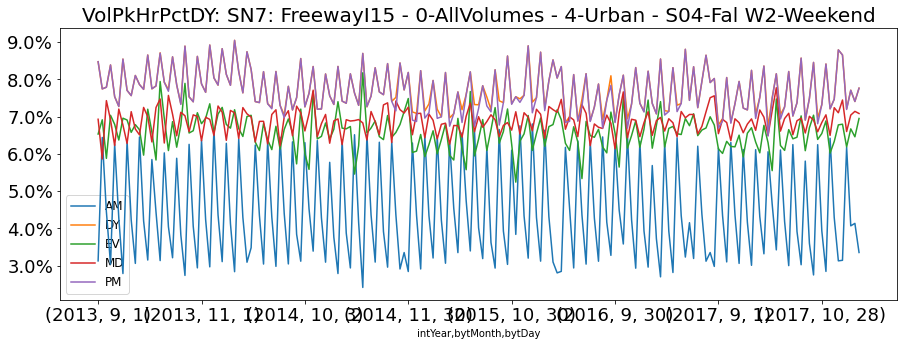

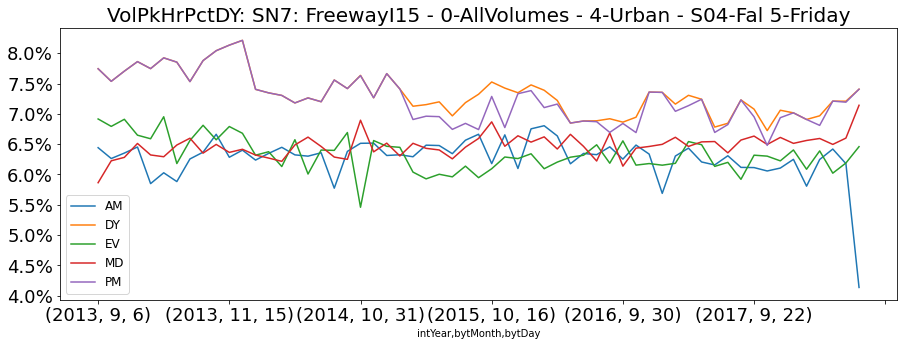

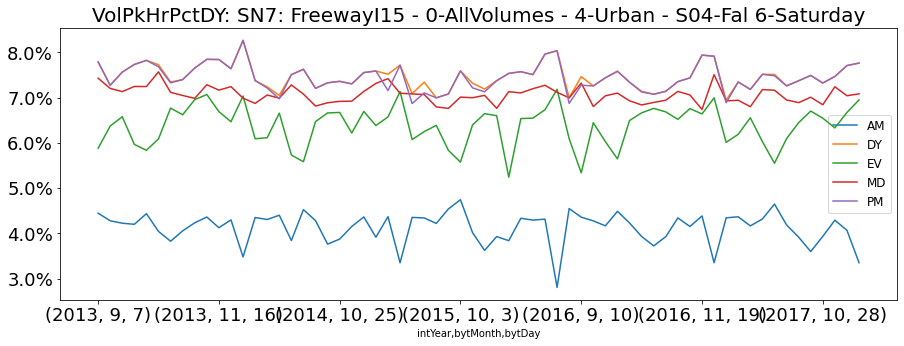

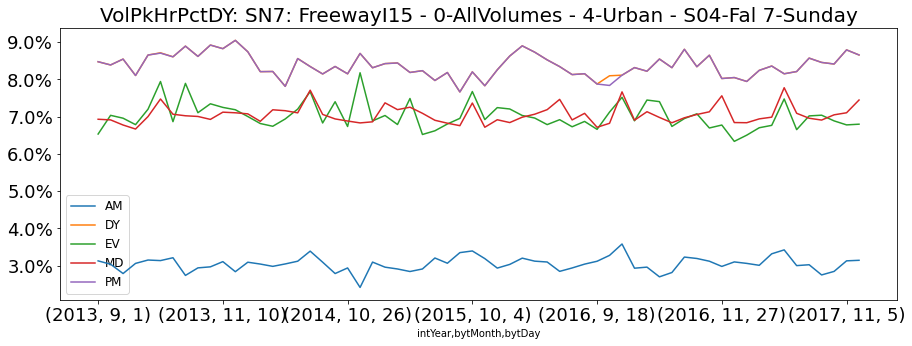

In [34]:
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','W1-Weekday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','1-Monday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','2-Tuesday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','3-Wednesday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','4-Thursday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','W2-Weekend','DY')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','5-Friday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','6-Saturday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SN7','S04-Fal','7-Sunday','DY')

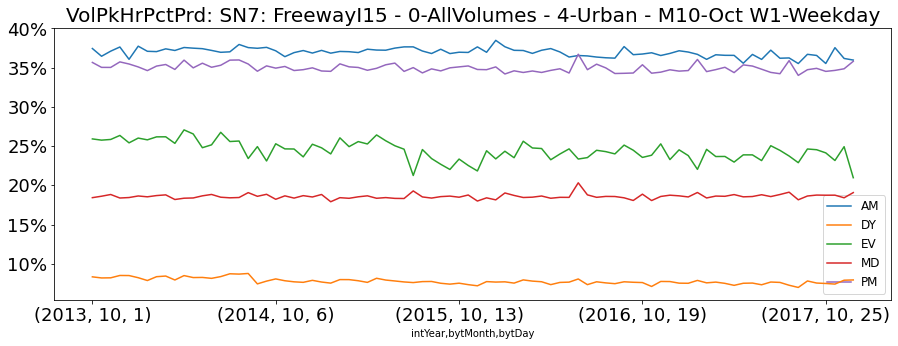

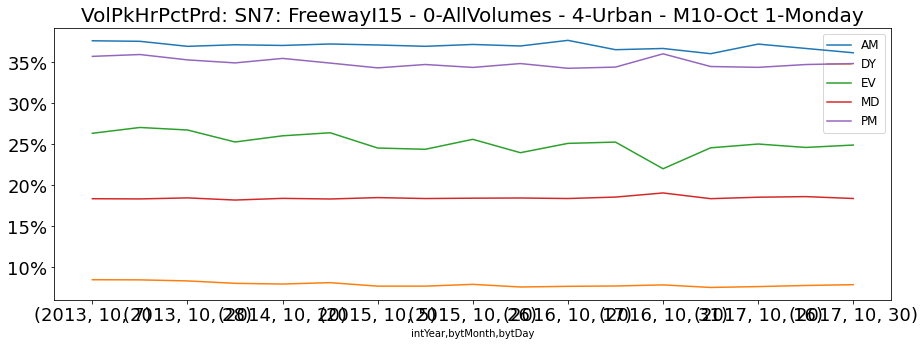

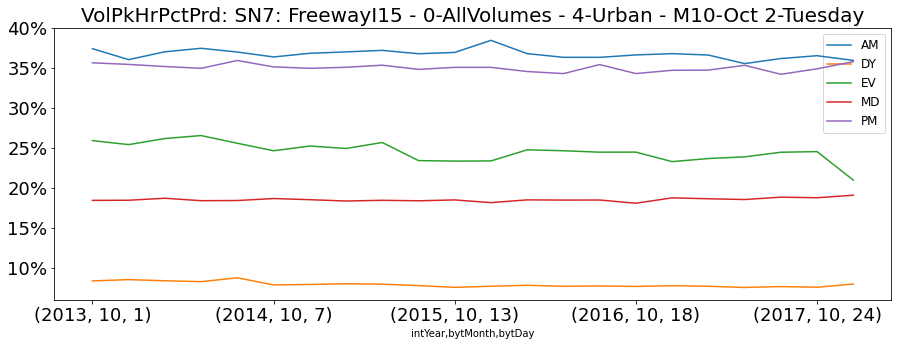

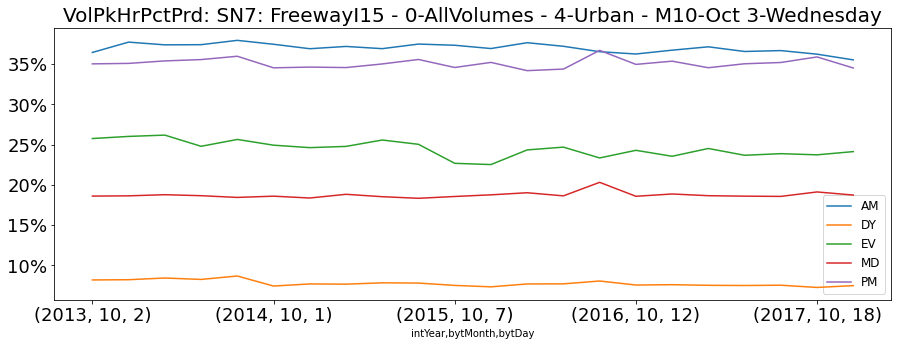

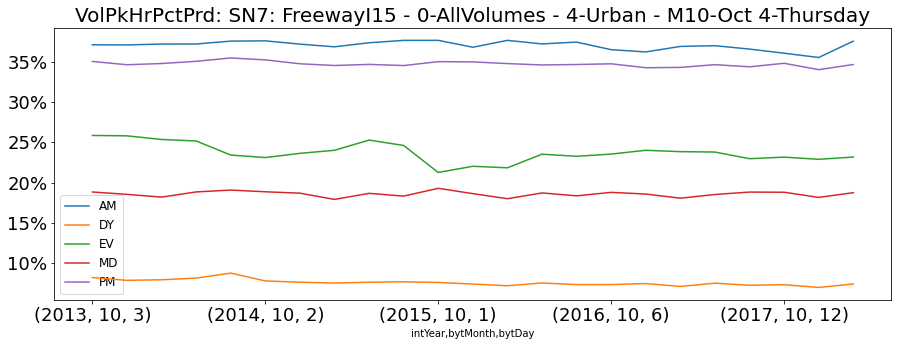

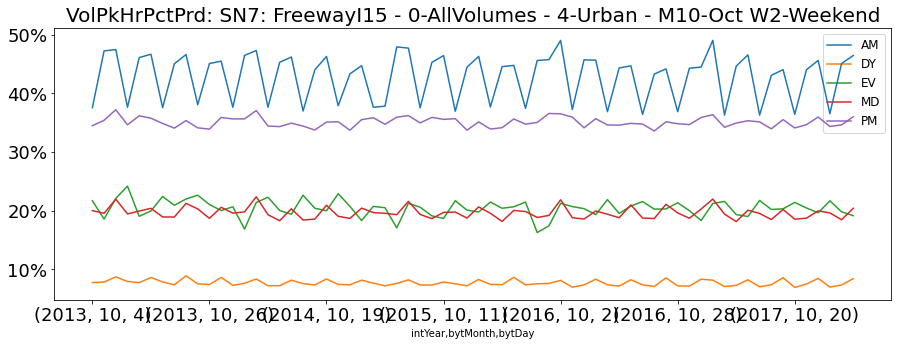

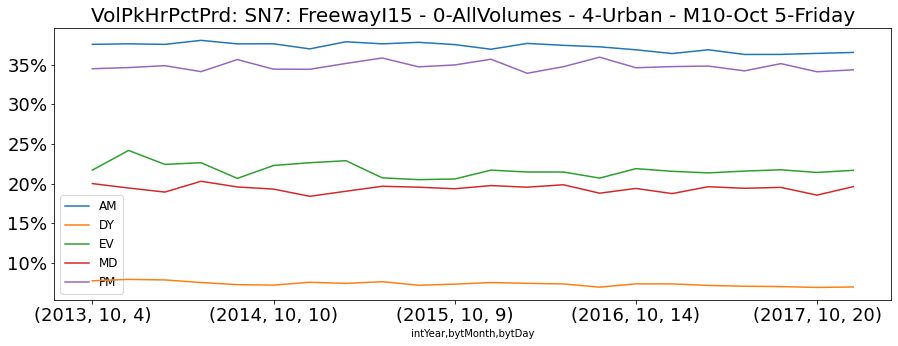

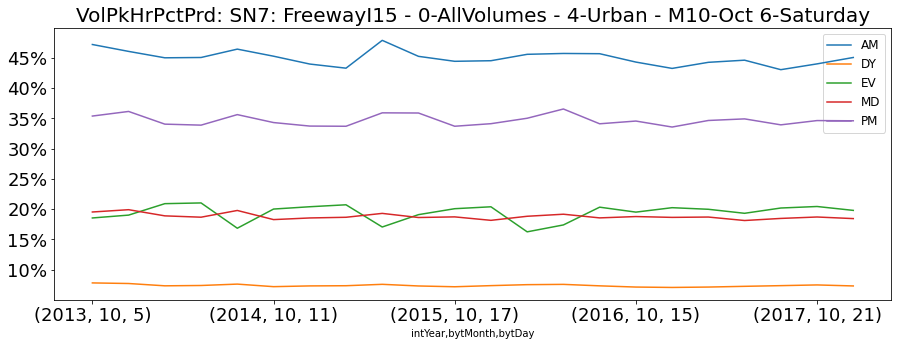

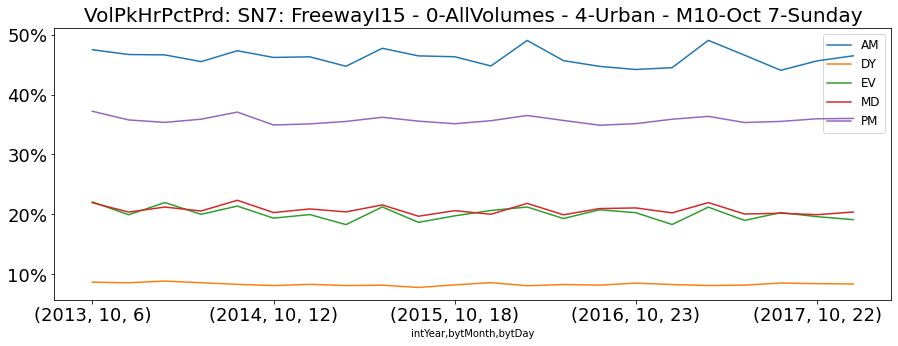

In [35]:
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','W1-Weekday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','1-Monday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','2-Tuesday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','3-Wednesday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','4-Thursday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','W2-Weekend','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','5-Friday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','6-Saturday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','7-Sunday','Prd')

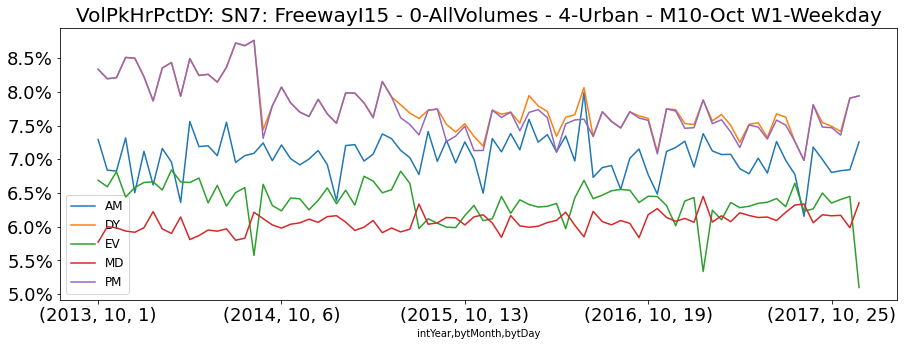

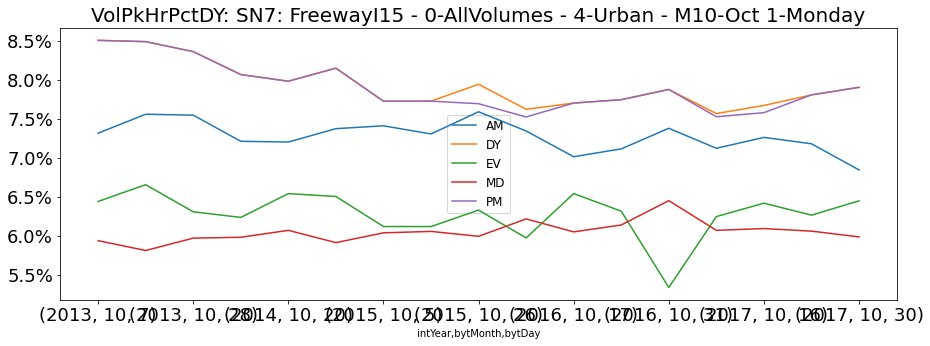

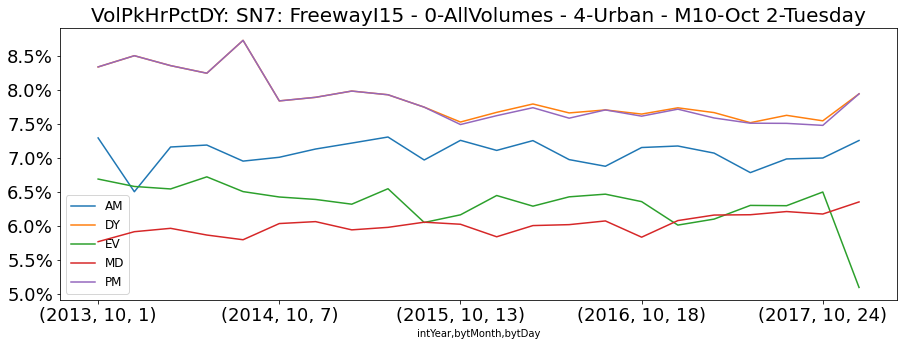

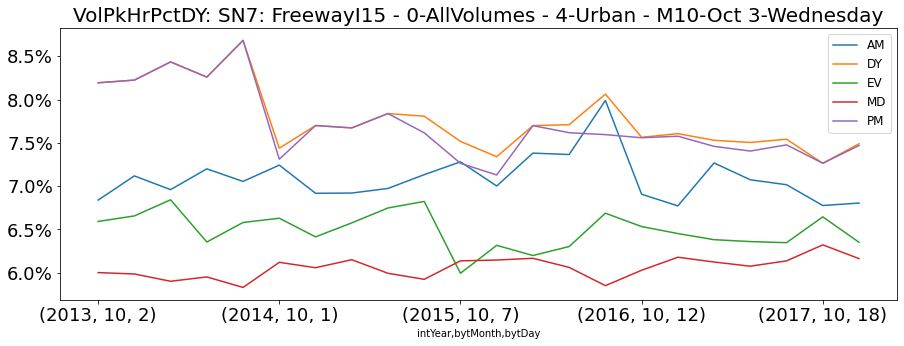

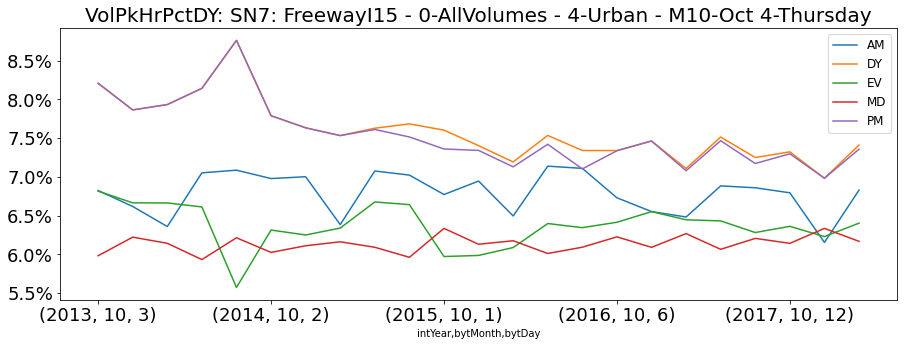

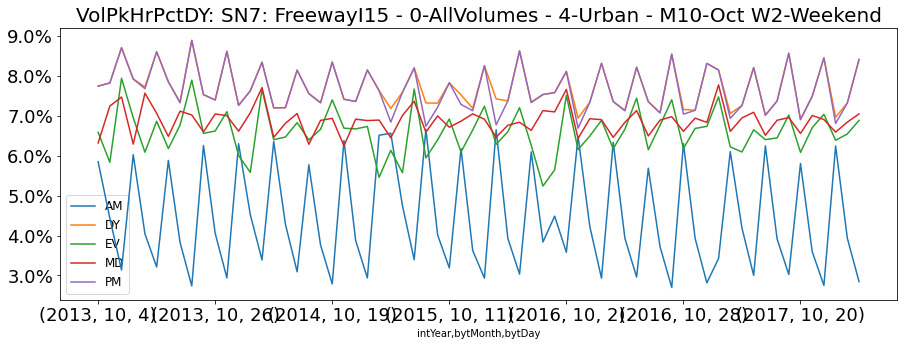

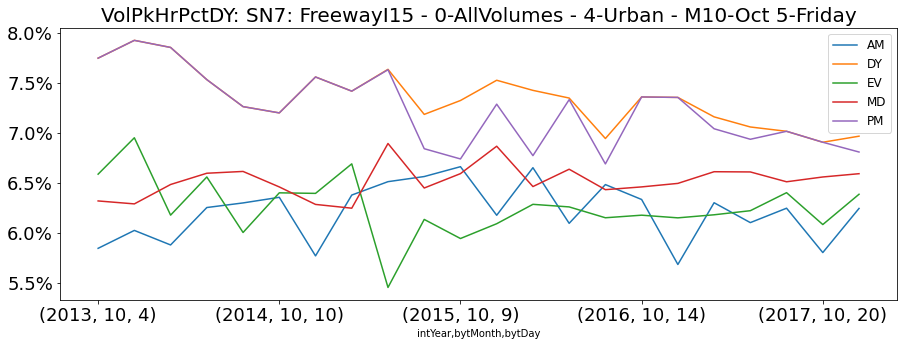

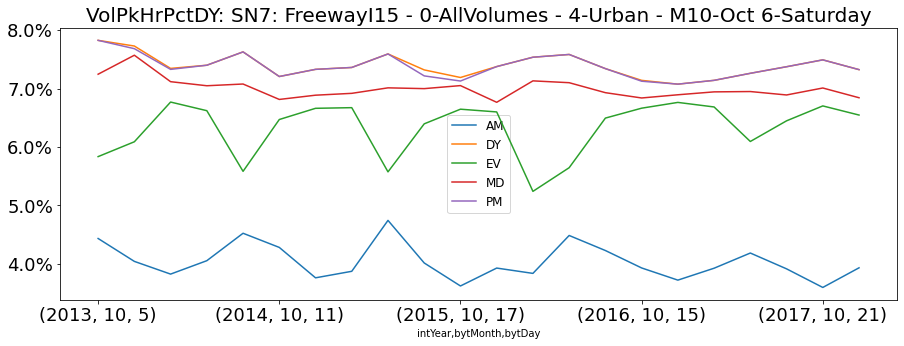

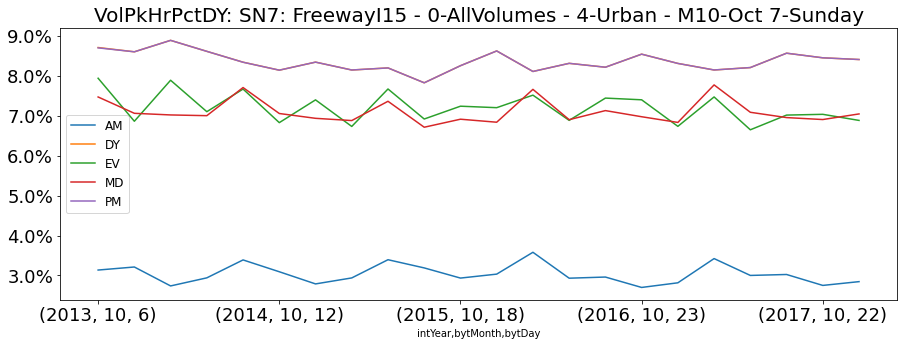

In [36]:
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','W1-Weekday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','1-Monday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','2-Tuesday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','3-Wednesday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','4-Thursday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','W2-Weekend','DY')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','5-Friday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','6-Saturday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SN7','M10-Oct','7-Sunday','DY')

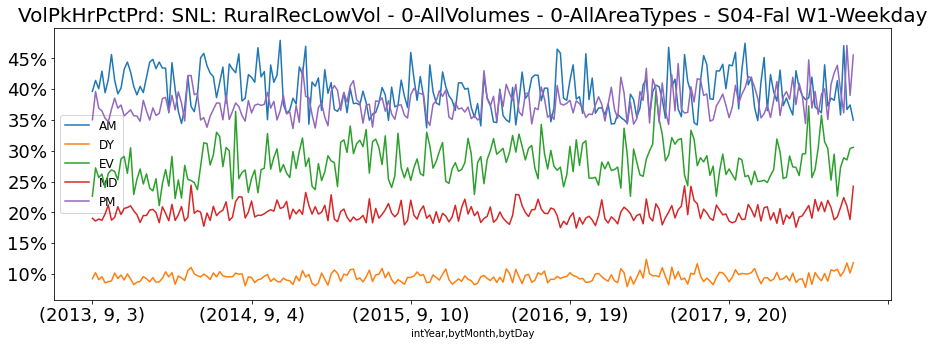

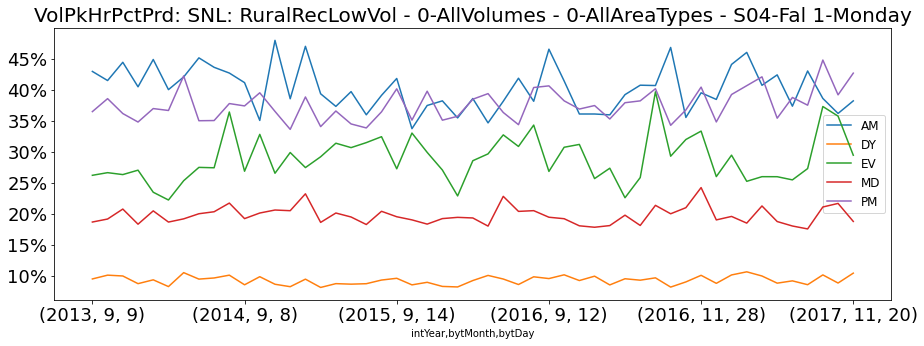

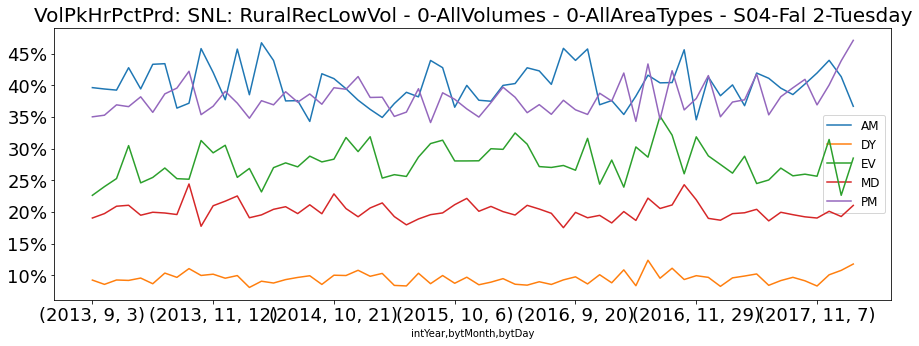

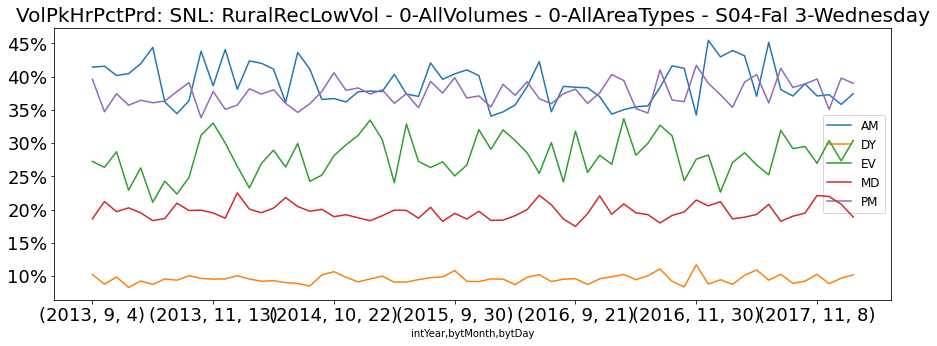

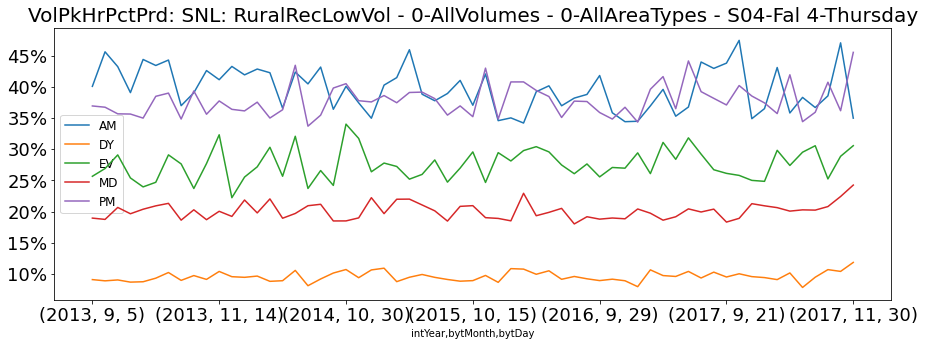

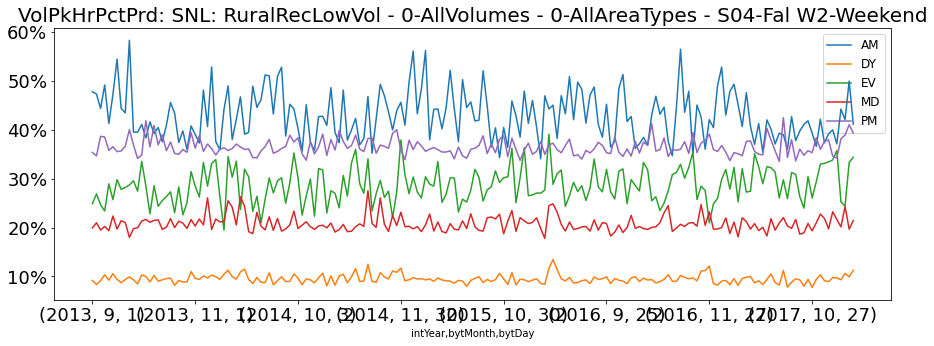

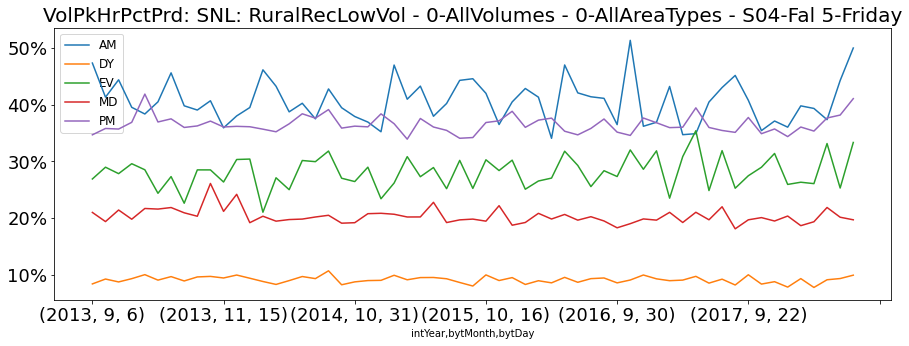

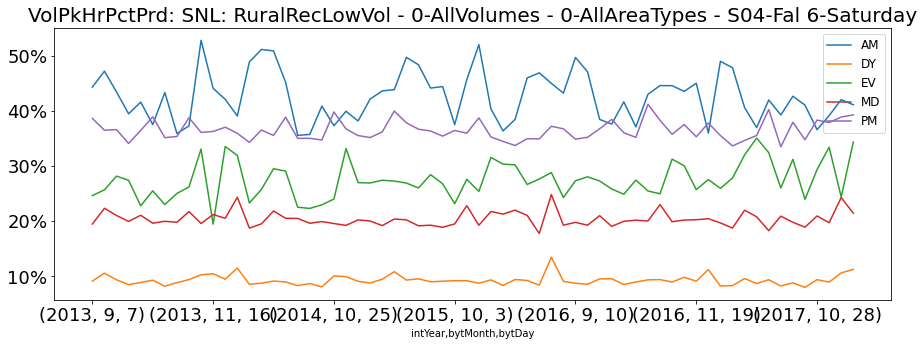

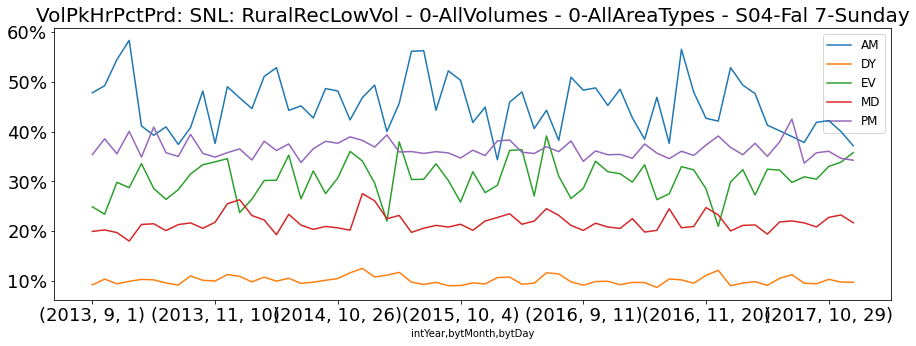

In [37]:
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','W1-Weekday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','1-Monday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','2-Tuesday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','3-Wednesday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','4-Thursday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','W2-Weekend','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','5-Friday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','6-Saturday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','7-Sunday','Prd')

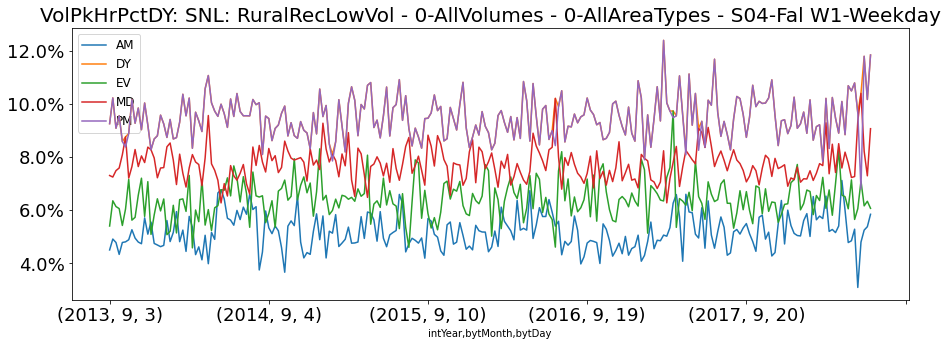

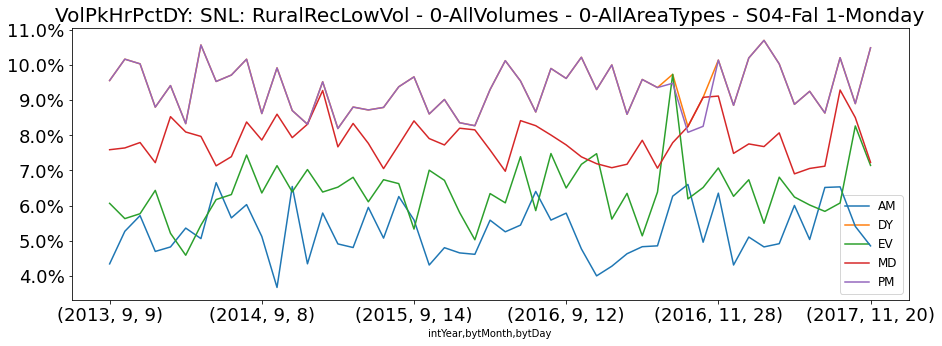

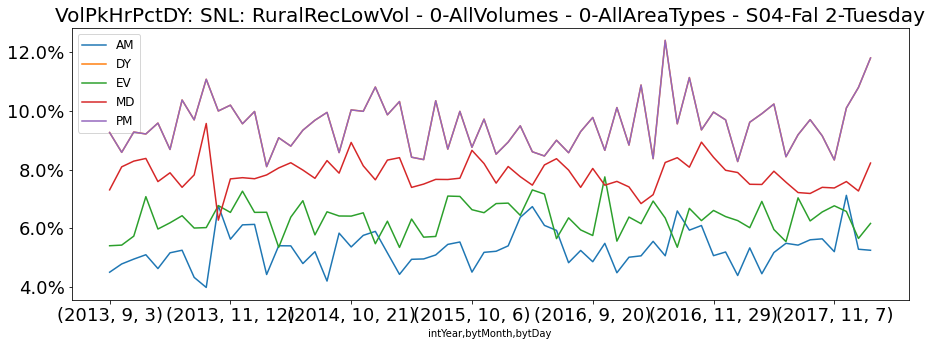

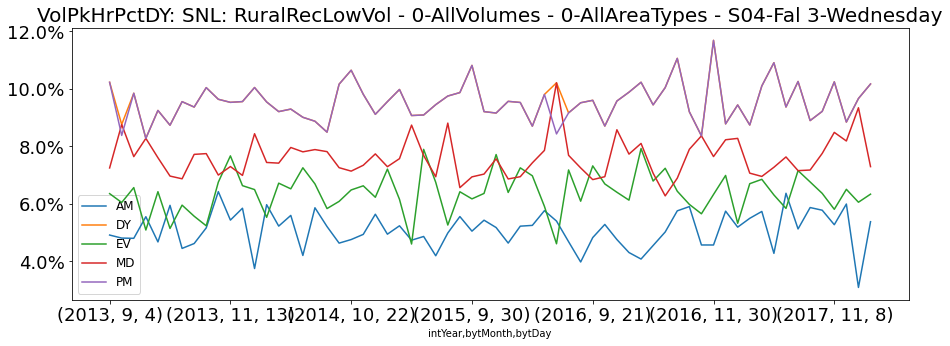

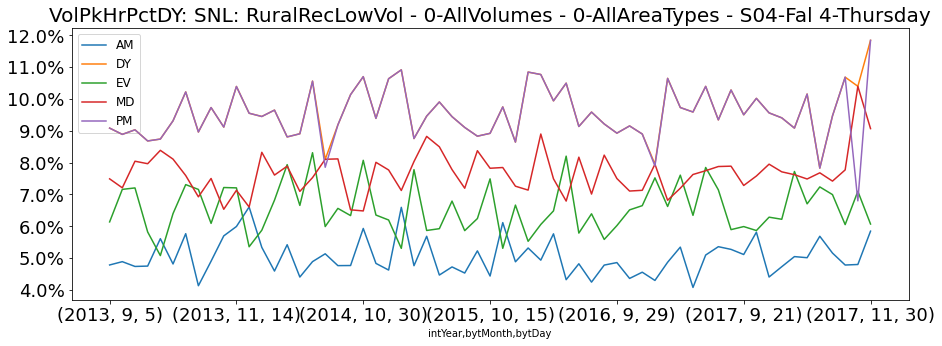

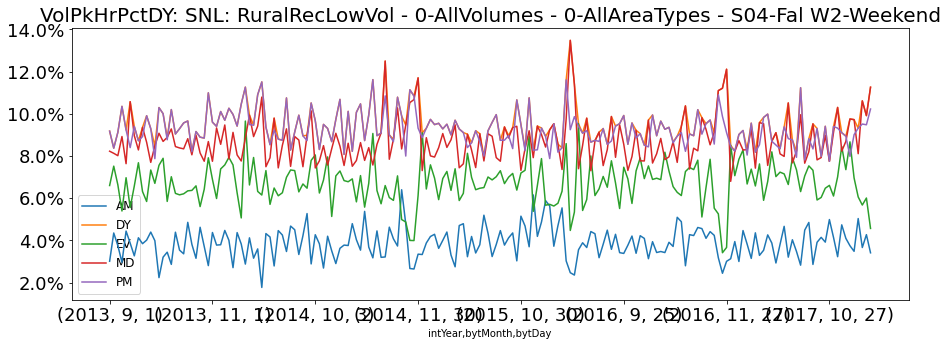

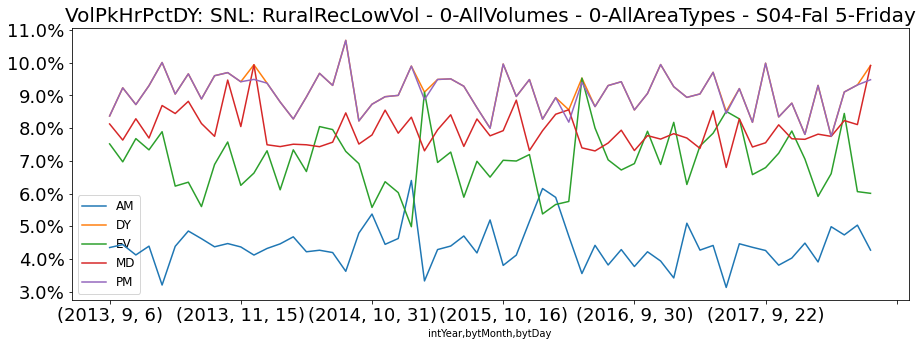

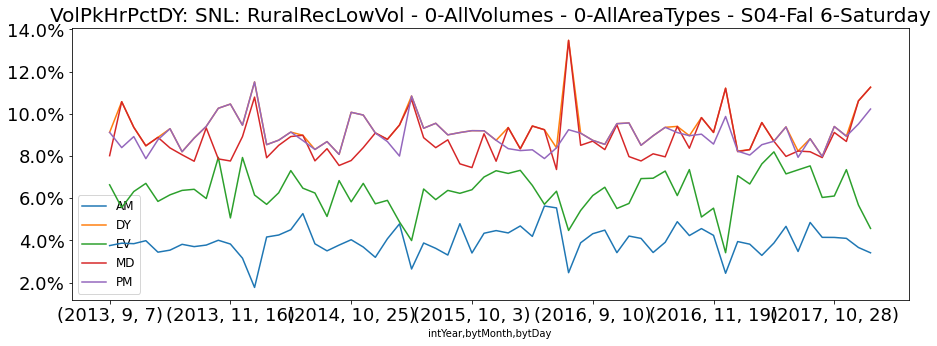

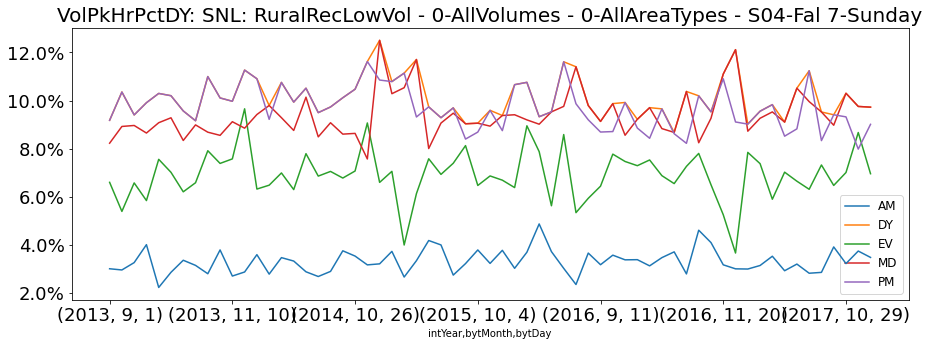

In [38]:
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','W1-Weekday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','1-Monday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','2-Tuesday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','3-Wednesday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','4-Thursday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','W2-Weekend','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','5-Friday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','6-Saturday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNL','S04-Fal','7-Sunday','DY')

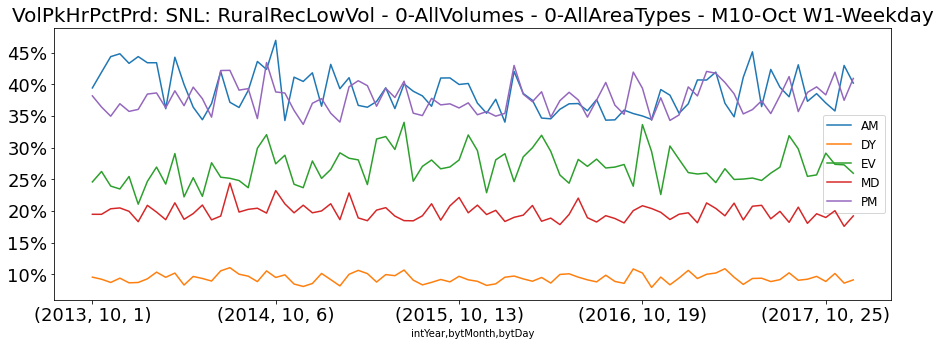

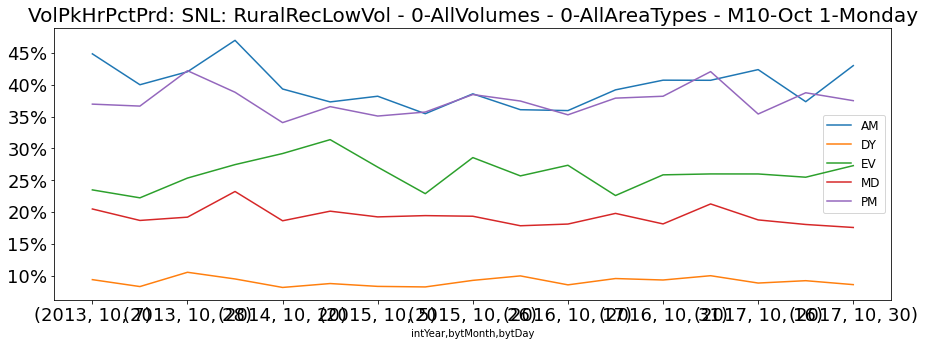

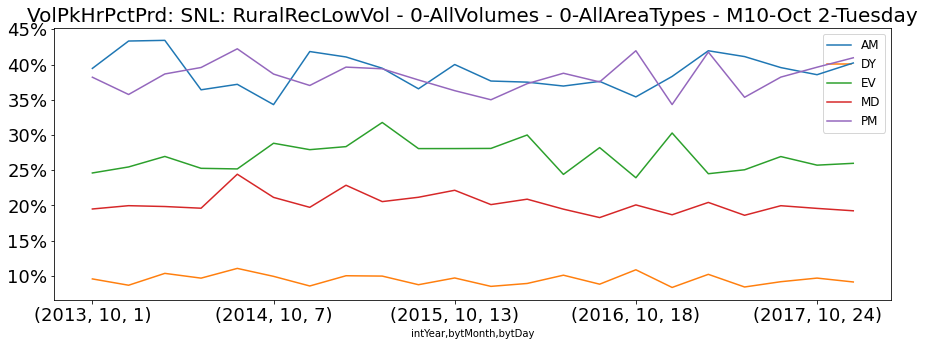

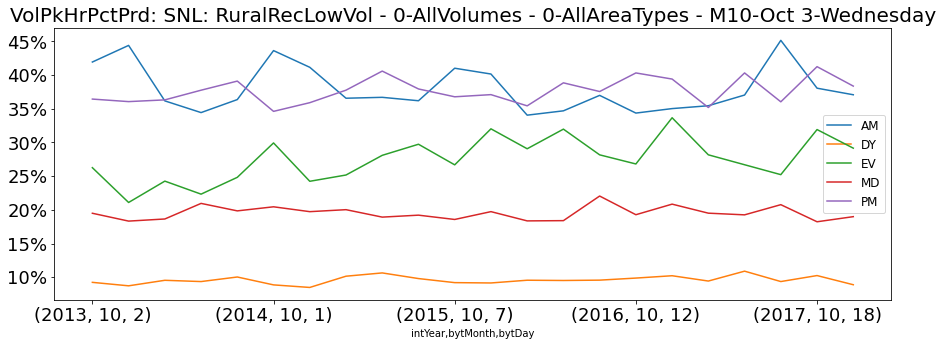

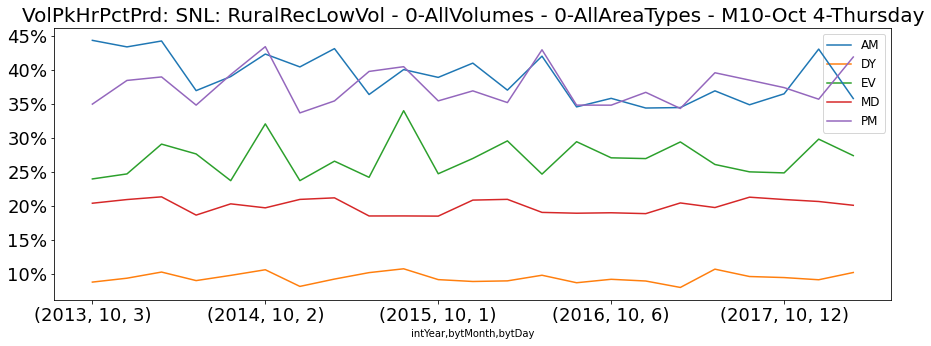

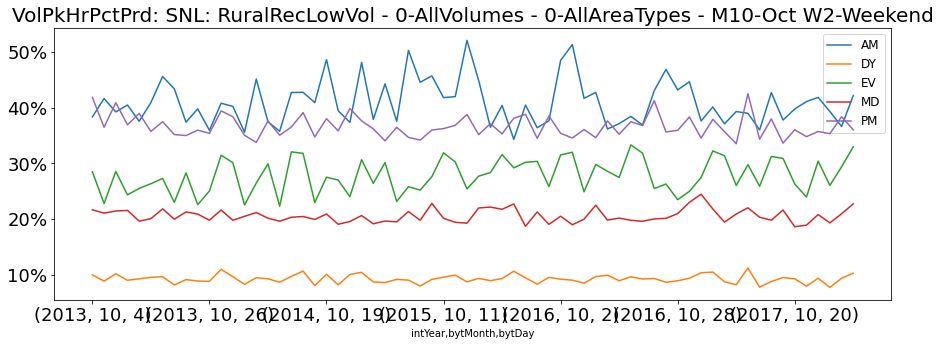

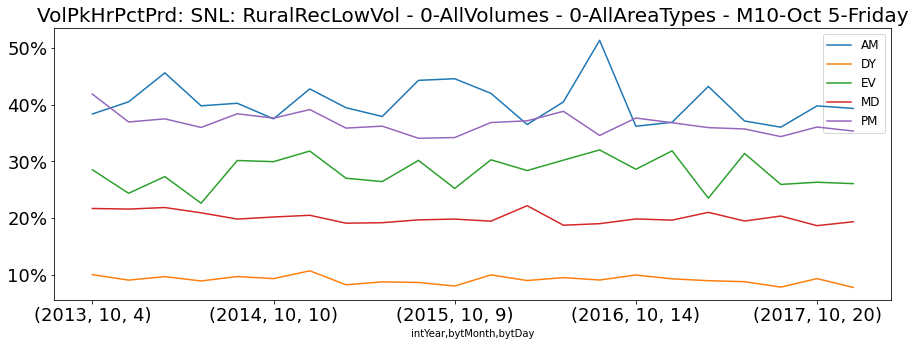

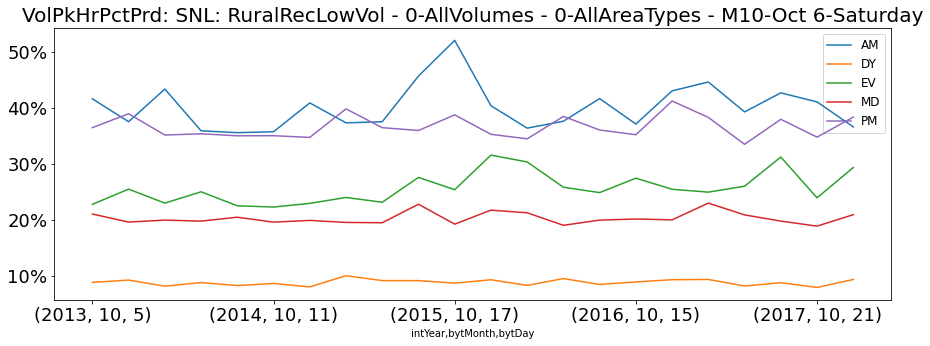

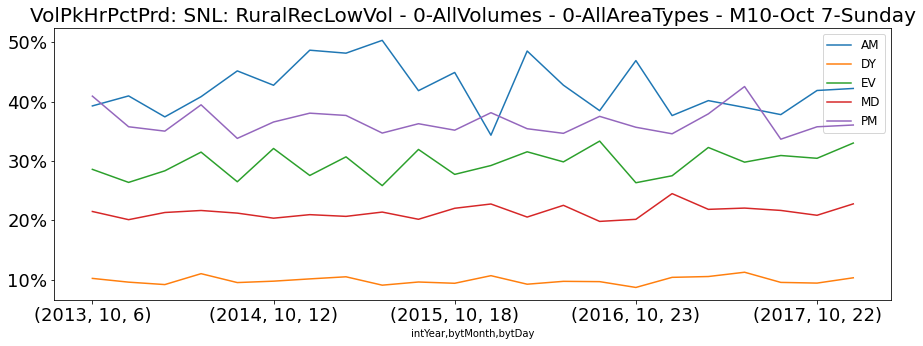

In [39]:
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','W1-Weekday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','1-Monday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','2-Tuesday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','3-Wednesday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','4-Thursday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','W2-Weekend','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','5-Friday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','6-Saturday','Prd')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','7-Sunday','Prd')

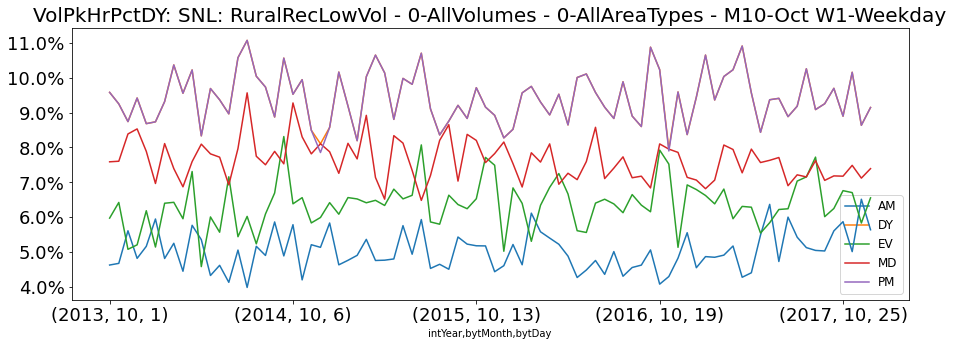

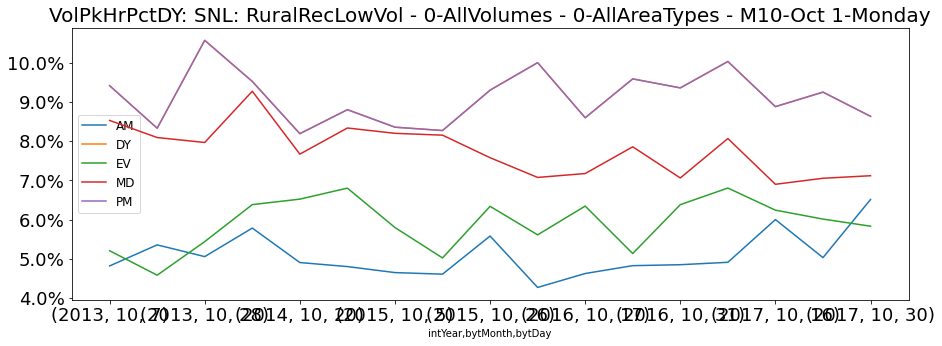

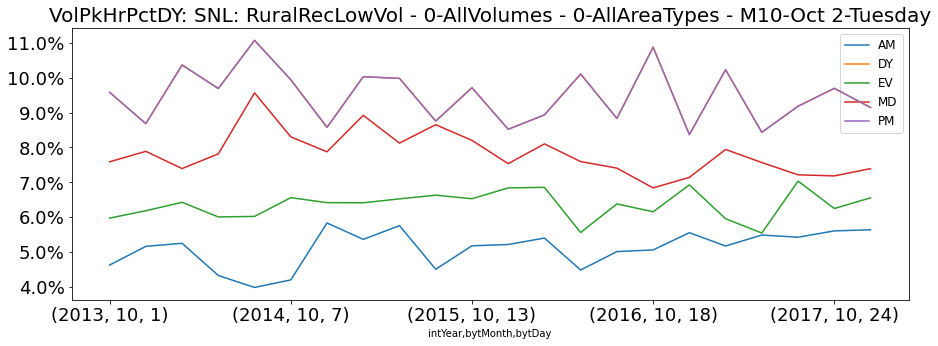

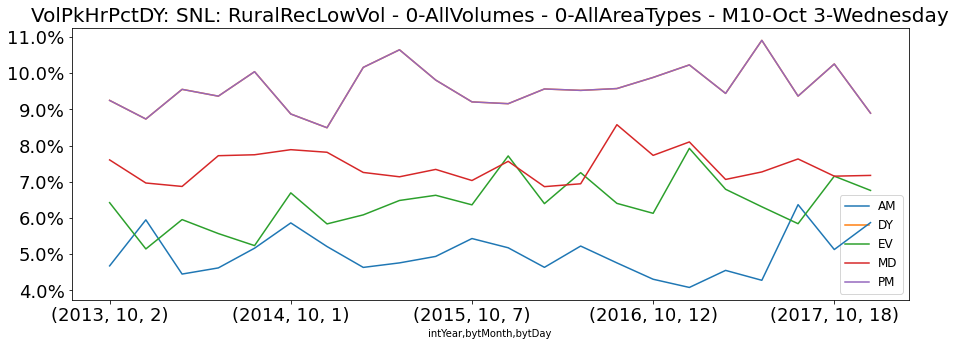

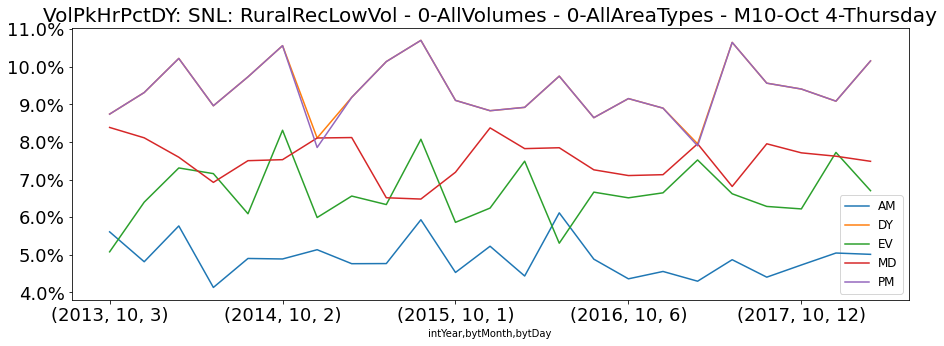

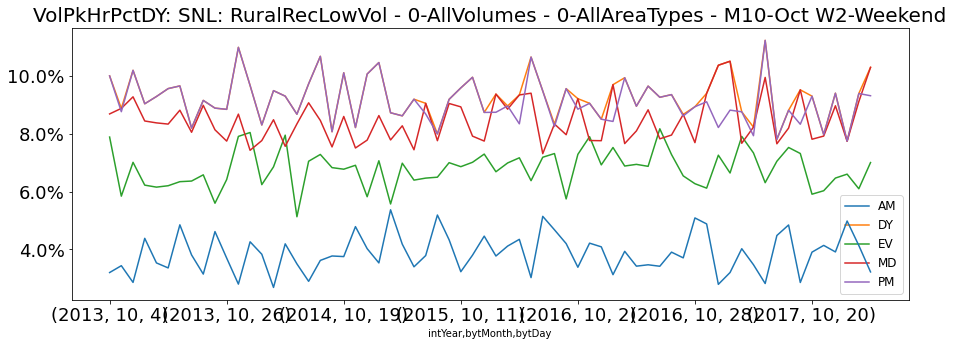

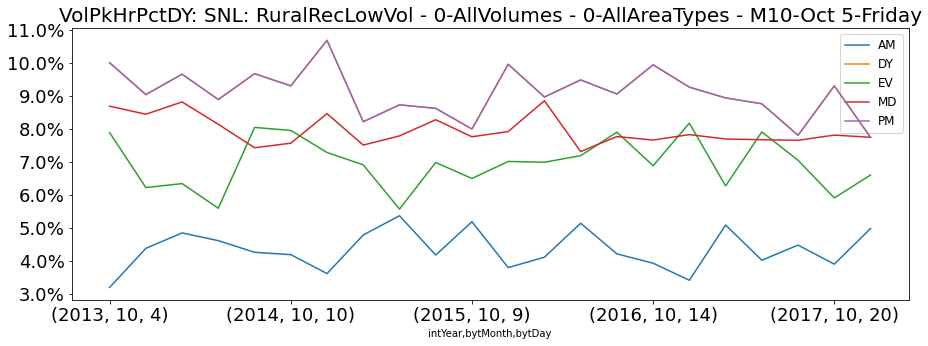

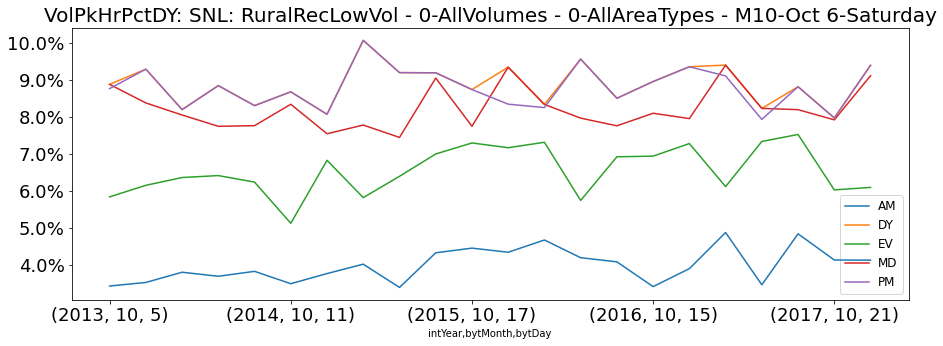

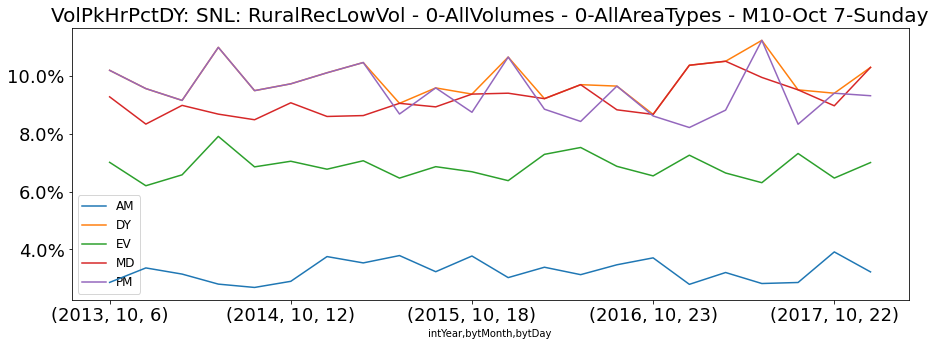

In [40]:
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','W1-Weekday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','1-Monday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','2-Tuesday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','3-Wednesday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','4-Thursday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','W2-Weekend','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','5-Friday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','6-Saturday','DY')
fnPlotSiteGroup_DOWSeasonGroup('SNL','M10-Oct','7-Sunday','DY')

In [41]:
df_PrdSiteGroupVol

,SiteGroupSeason,DOWGroup,SeasonGroup,intYear,bytMonth,bytDay,DOW,Prd,VolPrdSum,VolPkHrSum,numSites,VolPkHrPctPrd
0,SN0,1-Monday,M01-Jan,2013,1,7,2,AM,15,8,2,0.533333
1,SN0,1-Monday,M01-Jan,2013,1,7,2,DY,275,38,2,0.138182
2,SN0,1-Monday,M01-Jan,2013,1,7,2,EV,37,10,2,0.270270
3,SN0,1-Monday,M01-Jan,2013,1,7,2,MD,143,34,2,0.237762
4,SN0,1-Monday,M01-Jan,2013,1,7,2,PM,80,38,2,0.475000
...,...,...,...,...,...,...,...,...,...,...,...,...
1669615,SNX,W2-Weekend,S04-Fal,2017,11,25,7,AM,7441,3724,2,0.500470
1669616,SNX,W2-Weekend,S04-Fal,2017,11,25,7,DY,96386,7914,2,0.082107
1669617,SNX,W2-Weekend,S04-Fal,2017,11,25,7,EV,24924,6027,2,0.241815
1669618,SNX,W2-Weekend,S04-Fal,2017,11,25,7,MD,42210,7914,2,0.187491


# Create Aggregation for Factors

In [42]:
#AGGREGATE OVER TIME - Prd
df_PrdSiteGroupAgg = df_PrdSiteGroupVol.groupby(['SiteGroupSeason','SeasonGroup','DOWGroup','Prd'], as_index=False).agg({'VolPrdSum':[np.sum],'VolPkHrSum':[np.sum]})
df_PrdSiteGroupAgg.columns = df_PrdSiteGroupAgg.columns.droplevel(1)

df_PrdSiteGroupAgg_ForJoining = df_PrdSiteGroupAgg.copy()
df_PrdSiteGroupAgg_ForJoining['HrPctOf'] = 'Prd'
df_PrdSiteGroupAgg_ForJoining['VolPkHrPct'] = df_PrdSiteGroupAgg_ForJoining['VolPkHrSum'] / df_PrdSiteGroupAgg_ForJoining['VolPrdSum']
df_PrdSiteGroupAgg_ForJoining = df_PrdSiteGroupAgg_ForJoining.drop(columns=['VolPkHrSum','VolPrdSum'])
display(df_PrdSiteGroupAgg_ForJoining)

#AGGREGATE OVER TIME - DY
df_DYSiteGroupAgg = df_DySiteGroupVol.groupby(['SiteGroupSeason','SeasonGroup','DOWGroup'], as_index=False).agg({'VolDYSum':[np.sum]})
df_DYSiteGroupAgg.columns = df_DYSiteGroupAgg.columns.droplevel(1)
df_DYSiteGroupAgg_ForJoining = pd.DataFrame.merge(df_DYSiteGroupAgg,df_PrdSiteGroupAgg,on=(['SiteGroupSeason','SeasonGroup','DOWGroup']))
df_DYSiteGroupAgg_ForJoining['HrPctOf'] = 'DY'
df_DYSiteGroupAgg_ForJoining['VolPkHrPct'] = df_DYSiteGroupAgg_ForJoining['VolPkHrSum'] / df_DYSiteGroupAgg_ForJoining['VolDYSum']
df_DYSiteGroupAgg_ForJoining = df_DYSiteGroupAgg_ForJoining.drop(columns=['VolPkHrSum','VolDYSum','VolPrdSum'])
display(df_DYSiteGroupAgg_ForJoining)

#join
df_CCSVolPkHrPctByPrd = pd.concat([df_PrdSiteGroupAgg_ForJoining,df_DYSiteGroupAgg_ForJoining])
display(df_CCSVolPkHrPctByPrd)

,SiteGroupSeason,SeasonGroup,DOWGroup,Prd,HrPctOf,VolPkHrPct
0,SN0,M01-Jan,1-Monday,AM,Prd,0.552833
1,SN0,M01-Jan,1-Monday,DY,Prd,0.135094
2,SN0,M01-Jan,1-Monday,EV,Prd,0.292623
3,SN0,M01-Jan,1-Monday,MD,Prd,0.253412
4,SN0,M01-Jan,1-Monday,PM,Prd,0.417949
...,...,...,...,...,...,...
24475,SNX,S04-Fal,W2-Weekend,AM,Prd,0.465876
24476,SNX,S04-Fal,W2-Weekend,DY,Prd,0.079695
24477,SNX,S04-Fal,W2-Weekend,EV,Prd,0.216980
24478,SNX,S04-Fal,W2-Weekend,MD,Prd,0.189832


,SiteGroupSeason,SeasonGroup,DOWGroup,Prd,HrPctOf,VolPkHrPct
0,SN0,M01-Jan,1-Monday,AM,DY,0.045409
1,SN0,M01-Jan,1-Monday,DY,DY,0.135094
2,SN0,M01-Jan,1-Monday,EV,DY,0.044906
3,SN0,M01-Jan,1-Monday,MD,DY,0.119119
4,SN0,M01-Jan,1-Monday,PM,DY,0.123019
...,...,...,...,...,...,...
24475,SNX,S04-Fal,W2-Weekend,AM,DY,0.040663
24476,SNX,S04-Fal,W2-Weekend,DY,DY,0.079695
24477,SNX,S04-Fal,W2-Weekend,EV,DY,0.061226
24478,SNX,S04-Fal,W2-Weekend,MD,DY,0.077483


,SiteGroupSeason,SeasonGroup,DOWGroup,Prd,HrPctOf,VolPkHrPct
0,SN0,M01-Jan,1-Monday,AM,Prd,0.552833
1,SN0,M01-Jan,1-Monday,DY,Prd,0.135094
2,SN0,M01-Jan,1-Monday,EV,Prd,0.292623
3,SN0,M01-Jan,1-Monday,MD,Prd,0.253412
4,SN0,M01-Jan,1-Monday,PM,Prd,0.417949
...,...,...,...,...,...,...
24475,SNX,S04-Fal,W2-Weekend,AM,DY,0.040663
24476,SNX,S04-Fal,W2-Weekend,DY,DY,0.079695
24477,SNX,S04-Fal,W2-Weekend,EV,DY,0.061226
24478,SNX,S04-Fal,W2-Weekend,MD,DY,0.077483


In [43]:
#add manually factors for manually added season groups (XX...) or groups with 0 CCS sites (see SiteGroupSeasonFactors.xlsx)

#SNB is 1/3 between SNA and SND i.e., 2/3*SNA + 1/3*SND

df_SNA = df_CCSVolPkHrPctByPrd[df_CCSVolPkHrPctByPrd['SiteGroupSeason']=='SNA']
df_SND = df_CCSVolPkHrPctByPrd[df_CCSVolPkHrPctByPrd['SiteGroupSeason']=='SND']

df_SNB = pd.DataFrame.merge(df_SNA,df_SND,on=('SeasonGroup','DOWGroup','Prd','HrPctOf'))

df_SNB['SiteGroupSeason']   = 'SNB'
df_SNB['VolPkHrPct'] = ((2/3) * df_SNB['VolPkHrPct_x']) + ((1/3) *df_SNB['VolPkHrPct_y'])

df_SNB = df_SNB.drop(columns=['SiteGroupSeason_x','SiteGroupSeason_y','VolPkHrPct_x','VolPkHrPct_y'])
df_SNB = df_SNB[['SiteGroupSeason','SeasonGroup','DOWGroup','Prd','HrPctOf','VolPkHrPct']]

display(df_SNB)
                             
#SNC is 1/3 between SNA and SND

df_SNA = df_CCSVolPkHrPctByPrd[df_CCSVolPkHrPctByPrd['SiteGroupSeason']=='SNA']
df_SND = df_CCSVolPkHrPctByPrd[df_CCSVolPkHrPctByPrd['SiteGroupSeason']=='SND']

df_SNC = pd.DataFrame.merge(df_SNA,df_SND,on=('SeasonGroup','DOWGroup','Prd','HrPctOf'))

df_SNC['SiteGroupSeason']   = 'SNC'
df_SNC['VolPkHrPct'] = ((1/3) * df_SNC['VolPkHrPct_x']) + ((2/3) *df_SNC['VolPkHrPct_y'])

df_SNC = df_SNC.drop(columns=['SiteGroupSeason_x','SiteGroupSeason_y','VolPkHrPct_x','VolPkHrPct_y'])
df_SNC = df_SNC[['SiteGroupSeason','SeasonGroup','DOWGroup','Prd','HrPctOf','VolPkHrPct']]

display(df_SNC)

#XX1 is same as SN7

df_SN7 = df_CCSVolPkHrPctByPrd[df_CCSVolPkHrPctByPrd['SiteGroupSeason']=='SN7']

df_XX1 = df_SN7.copy()
df_XX1['SiteGroupSeason'] = 'XX1'

display(df_XX1)

#XX2 is same as SND

df_SND = df_CCSVolPkHrPctByPrd[df_CCSVolPkHrPctByPrd['SiteGroupSeason']=='SND']

df_XX2 = df_SND.copy()
df_XX2['SiteGroupSeason'] = 'XX2'

display(df_XX2)

#XX3 is same as SNU

df_SNU = df_CCSVolPkHrPctByPrd[df_CCSVolPkHrPctByPrd['SiteGroupSeason']=='SNU']

df_XX3 = df_SNU.copy()
df_XX3['SiteGroupSeason'] = 'XX3'

display(df_XX3)

#XX4 is average of SN8, SNF, and SNG

df_SN8 = df_CCSVolPkHrPctByPrd[df_CCSVolPkHrPctByPrd['SiteGroupSeason']=='SN8']
df_SNF = df_CCSVolPkHrPctByPrd[df_CCSVolPkHrPctByPrd['SiteGroupSeason']=='SNF']
df_SNG = df_CCSVolPkHrPctByPrd[df_CCSVolPkHrPctByPrd['SiteGroupSeason']=='SNG']

df_SN8F = pd.DataFrame.merge(df_SN8,df_SNF,on=('SeasonGroup','DOWGroup','Prd','HrPctOf'))

df_XX4 = pd.DataFrame.merge(df_SN8F,df_SNG,on=('SeasonGroup','DOWGroup','Prd','HrPctOf'))
df_XX4 = df_XX4.rename(columns={"SiteGroupSeason":"SiteGroupSeason_z","VolPkHrPct":"VolPkHrPct_z"})

df_XX4['SiteGroupSeason']   = 'XX4'
df_XX4['VolPkHrPct'] = (df_XX4['VolPkHrPct_x'] + df_XX4['VolPkHrPct_y'] + df_XX4['VolPkHrPct_z']) / 3

df_XX4 = df_XX4.drop(columns=['SiteGroupSeason_x','SiteGroupSeason_y','SiteGroupSeason_z','VolPkHrPct_x','VolPkHrPct_y','VolPkHrPct_z'])
df_XX4 = df_XX4[['SiteGroupSeason','SeasonGroup','DOWGroup','Prd','HrPctOf','VolPkHrPct']]

display(df_XX4)


df_CCSVolPkHrPctByPrd = df_CCSVolPkHrPctByPrd.append(df_SNB)
df_CCSVolPkHrPctByPrd = df_CCSVolPkHrPctByPrd.append(df_SNC)
df_CCSVolPkHrPctByPrd = df_CCSVolPkHrPctByPrd.append(df_XX1)
df_CCSVolPkHrPctByPrd = df_CCSVolPkHrPctByPrd.append(df_XX2)
df_CCSVolPkHrPctByPrd = df_CCSVolPkHrPctByPrd.append(df_XX3)
df_CCSVolPkHrPctByPrd = df_CCSVolPkHrPctByPrd.append(df_XX4)

display(df_CCSVolPkHrPctByPrd)

,SiteGroupSeason,SeasonGroup,DOWGroup,Prd,HrPctOf,VolPkHrPct
0,SNB,M01-Jan,1-Monday,AM,Prd,0.399068
1,SNB,M01-Jan,1-Monday,DY,Prd,0.089644
2,SNB,M01-Jan,1-Monday,EV,Prd,0.246691
3,SNB,M01-Jan,1-Monday,MD,Prd,0.188054
4,SNB,M01-Jan,1-Monday,PM,Prd,0.369347
...,...,...,...,...,...,...
1525,SNB,S04-Fal,W2-Weekend,AM,DY,0.048904
1526,SNB,S04-Fal,W2-Weekend,DY,DY,0.079174
1527,SNB,S04-Fal,W2-Weekend,EV,DY,0.061437
1528,SNB,S04-Fal,W2-Weekend,MD,DY,0.070307


,SiteGroupSeason,SeasonGroup,DOWGroup,Prd,HrPctOf,VolPkHrPct
0,SNC,M01-Jan,1-Monday,AM,Prd,0.399599
1,SNC,M01-Jan,1-Monday,DY,Prd,0.089609
2,SNC,M01-Jan,1-Monday,EV,Prd,0.247749
3,SNC,M01-Jan,1-Monday,MD,Prd,0.187924
4,SNC,M01-Jan,1-Monday,PM,Prd,0.369040
...,...,...,...,...,...,...
1525,SNC,S04-Fal,W2-Weekend,AM,DY,0.050933
1526,SNC,S04-Fal,W2-Weekend,DY,DY,0.077885
1527,SNC,S04-Fal,W2-Weekend,EV,DY,0.060342
1528,SNC,S04-Fal,W2-Weekend,MD,DY,0.069159


,SiteGroupSeason,SeasonGroup,DOWGroup,Prd,HrPctOf,VolPkHrPct
5355,XX1,M01-Jan,1-Monday,AM,Prd,0.374599
5356,XX1,M01-Jan,1-Monday,DY,Prd,0.083656
5357,XX1,M01-Jan,1-Monday,EV,Prd,0.263218
5358,XX1,M01-Jan,1-Monday,MD,Prd,0.186813
5359,XX1,M01-Jan,1-Monday,PM,Prd,0.356375
...,...,...,...,...,...,...
6115,XX1,S04-Fal,W2-Weekend,AM,DY,0.047234
6116,XX1,S04-Fal,W2-Weekend,DY,DY,0.075929
6117,XX1,S04-Fal,W2-Weekend,EV,DY,0.064926
6118,XX1,S04-Fal,W2-Weekend,MD,DY,0.068251


,SiteGroupSeason,SeasonGroup,DOWGroup,Prd,HrPctOf,VolPkHrPct
8415,XX2,M01-Jan,1-Monday,AM,Prd,0.400129
8416,XX2,M01-Jan,1-Monday,DY,Prd,0.089575
8417,XX2,M01-Jan,1-Monday,EV,Prd,0.248807
8418,XX2,M01-Jan,1-Monday,MD,Prd,0.187794
8419,XX2,M01-Jan,1-Monday,PM,Prd,0.368733
...,...,...,...,...,...,...
9175,XX2,S04-Fal,W2-Weekend,AM,DY,0.052961
9176,XX2,S04-Fal,W2-Weekend,DY,DY,0.076596
9177,XX2,S04-Fal,W2-Weekend,EV,DY,0.059247
9178,XX2,S04-Fal,W2-Weekend,MD,DY,0.068012


,SiteGroupSeason,SeasonGroup,DOWGroup,Prd,HrPctOf,VolPkHrPct
21420,XX3,M01-Jan,1-Monday,AM,Prd,0.414034
21421,XX3,M01-Jan,1-Monday,DY,Prd,0.092501
21422,XX3,M01-Jan,1-Monday,EV,Prd,0.276370
21423,XX3,M01-Jan,1-Monday,MD,Prd,0.199237
21424,XX3,M01-Jan,1-Monday,PM,Prd,0.363196
...,...,...,...,...,...,...
22180,XX3,S04-Fal,W2-Weekend,AM,DY,0.044548
22181,XX3,S04-Fal,W2-Weekend,DY,DY,0.080829
22182,XX3,S04-Fal,W2-Weekend,EV,DY,0.065061
22183,XX3,S04-Fal,W2-Weekend,MD,DY,0.072395


,SiteGroupSeason,SeasonGroup,DOWGroup,Prd,HrPctOf,VolPkHrPct
0,XX4,M01-Jan,1-Monday,AM,Prd,0.399466
1,XX4,M01-Jan,1-Monday,DY,Prd,0.106764
2,XX4,M01-Jan,1-Monday,EV,Prd,0.280030
3,XX4,M01-Jan,1-Monday,MD,Prd,0.219054
4,XX4,M01-Jan,1-Monday,PM,Prd,0.382721
...,...,...,...,...,...,...
1525,XX4,S04-Fal,W2-Weekend,AM,DY,0.061062
1526,XX4,S04-Fal,W2-Weekend,DY,DY,0.087213
1527,XX4,S04-Fal,W2-Weekend,EV,DY,0.062317
1528,XX4,S04-Fal,W2-Weekend,MD,DY,0.065813


,SiteGroupSeason,SeasonGroup,DOWGroup,Prd,HrPctOf,VolPkHrPct
0,SN0,M01-Jan,1-Monday,AM,Prd,0.552833
1,SN0,M01-Jan,1-Monday,DY,Prd,0.135094
2,SN0,M01-Jan,1-Monday,EV,Prd,0.292623
3,SN0,M01-Jan,1-Monday,MD,Prd,0.253412
4,SN0,M01-Jan,1-Monday,PM,Prd,0.417949
...,...,...,...,...,...,...
1525,XX4,S04-Fal,W2-Weekend,AM,DY,0.061062
1526,XX4,S04-Fal,W2-Weekend,DY,DY,0.087213
1527,XX4,S04-Fal,W2-Weekend,EV,DY,0.062317
1528,XX4,S04-Fal,W2-Weekend,MD,DY,0.065813


# Export to CSV

In [44]:
#export to csv in data-processed
df_CCSVolPkHrPctByPrd['VolPkHrPct'] = round(df_CCSVolPkHrPctByPrd['VolPkHrPct'],4)
df_CCSVolPkHrPctByPrd.to_csv(os.path.join(dirResults, r'TODFactors.csv'),index=False)
display('Done exporting to csv')

'Done exporting to csv'